In [13]:
import pandas as pd
import os
import numpy as np
from numpy import column_stack
from pandas import read_csv
import matplotlib.pyplot as plt
from matplotlib import pyplot
import seaborn as sns
from scipy.stats import mode
import xgboost as xgb
from xgboost import XGBClassifier
from xgboost import plot_importance
from matplotlib import pyplot
from matplotlib import cm
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn import svm
from sklearn.metrics import accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import classification_report,confusion_matrix, roc_auc_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import precision_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from joblib import dump
from joblib import load
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE # TSNE module
import pickle

In [14]:
#Matriz de Confusion
def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.show()

In [15]:
def plot_cm(y_true, y_pred, figsize=(10,10)):
    cm = confusion_matrix(y_true, y_pred, labels=np.unique(y_true))
    cm_sum = np.sum(cm, axis=1, keepdims=True)
    cm_perc = cm / cm_sum.astype(float) * 100
    annot = np.empty_like(cm).astype(str)
    nrows, ncols = cm.shape
    for i in range(nrows):
        for j in range(ncols):
            c = cm[i, j]
            p = cm_perc[i, j]
            if i == j:
                s = cm_sum[i]
                annot[i, j] = '%.1f%%\n%d/%d' % (p, c, s)
            elif c == 0:
                annot[i, j] = ''
            else:
                annot[i, j] = '%.1f%%\n%d' % (p, c)
    cm = pd.DataFrame(cm, index=np.unique(y_true), columns=np.unique(y_true))
    cm.index.name = 'Actual'
    cm.columns.name = 'Predicted'
    fig, ax = plt.subplots(figsize=figsize)
    sns.heatmap(cm, cmap= "YlGnBu", annot=annot, fmt='', ax=ax)
    


In [16]:
random_state = 9
test_size = 0.3
seed = 9
params = {
    'max_depth': 5,
    'nthread' : 4,
    'learning_rate': 0.1,
    'n_estimators': 1000,
    'random_state':random_state,
}

# Normal vs ataque

In [17]:
print('Leyendo el archivo csv')
df = pd.read_csv("D:\\jupyter\\csv\\UNSW_NB15_training-set.csv")
#dataframe11 = pd.read_csv("D:\\jupyter\\csv\\UNSW_NB15_testing-set.csv")
print('Concatenar los archivos')
#df = pd.concat([dataframe1, dataframe11])

Leyendo el archivo csv
Concatenar los archivos


In [18]:
df2 = df.drop(['id','attack_cat'], axis = 1)
df2['proto'] = df2['proto'].astype('category')
df2['service'] = df2['service'].astype('category')
df2['state'] = df2['state'].astype('category')

In [19]:
cat_columns = df2.select_dtypes(['category']).columns
cat_columns
df2[cat_columns] = df2[cat_columns].apply(lambda x: x.cat.codes)

In [20]:
Y = df2['label']
X = df2.drop(columns=['label'])

In [27]:
X = X[['smean','ct_srv_src','tcprtt','sload','dtcpb','dload','dur','djit','dmean','ct_src_ltm']]

In [28]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_sample(X, Y)

In [29]:
X_train, X_test, y_train, y_test = train_test_split(X_train_res, y_train_res,
test_size=test_size, random_state=seed)

In [30]:
model = XGBClassifier(**params)
model.fit(X_train, y_train)
print(model)
predictions = model.predict(X_test)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
              random_state=9, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              subsample=1, tree_method='exact', validate_parameters=1,
              verbosity=None)


In [31]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions))
print('Recall',recall_score(y_test,predictions))
print('F1',f1_score(y_test,predictions))

[[33872  1759]
 [ 1596 34378]]
Accuracy 0.9531457300467845
Precision 0.9513241276254255
Recall 0.9556346250069495
F1 0.953474504583212


In [32]:
roc_auc_score(y_test, predictions)

0.9531337504367352

In [25]:
from sklearn.metrics import roc_auc_score

In [82]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=test_size, random_state=seed)

In [10]:
model = XGBClassifier()
model.fit(X_train, y_train)
print(model)
predictions = model.predict(X_test)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [13]:
import pickle
pickle.dump(model, open('binario.sav', 'wb'))

In [11]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions))
print('Recall',recall_score(y_test,predictions))
print('F1',f1_score(y_test,predictions))

[[15445  1301]
 [  851 35006]]
Accuracy 0.9590897857536642
Precision 0.9641666896190817
Recall 0.9762668377164849
F1 0.9701790366387673


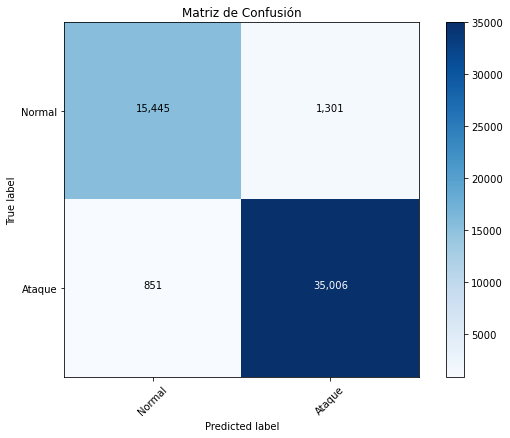

In [13]:
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Normal','Ataque'],
                      title        = "Matriz de Confusión")

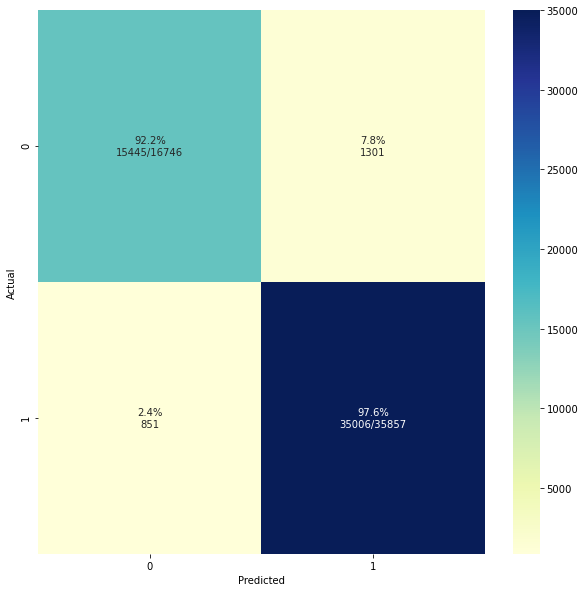

In [12]:
plot_cm(y_test, predictions)

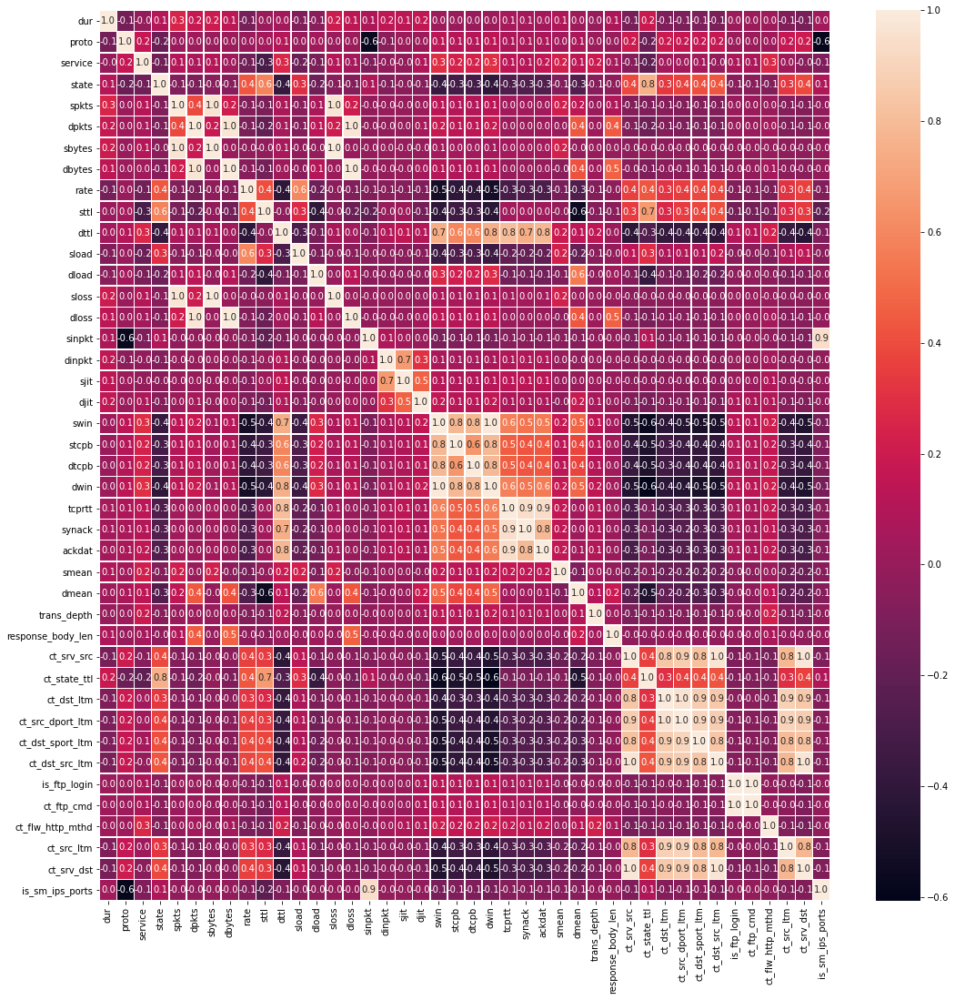

In [116]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

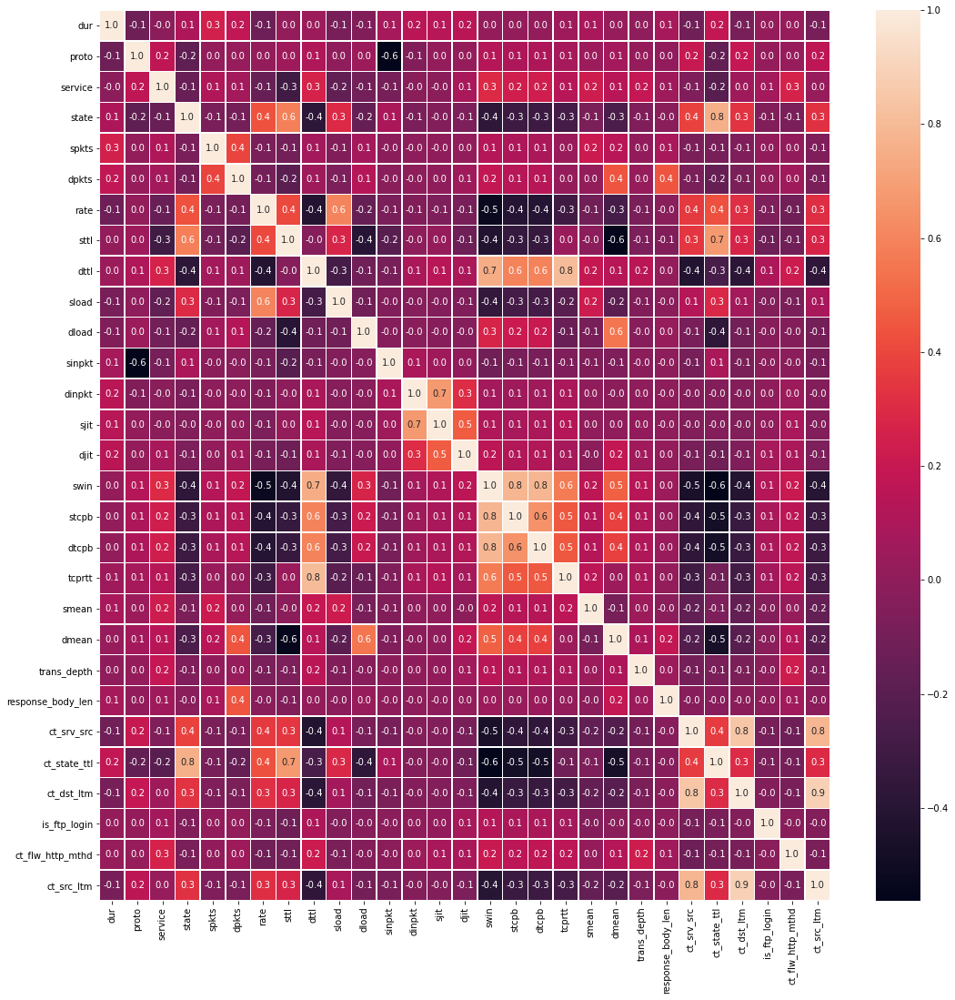

In [117]:
# Create correlation matrix
corr_matrix = X.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.90)]
X = X.drop(X[to_drop], axis=1)

f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [118]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=test_size, random_state=seed)

In [119]:
model = XGBClassifier()
model.fit(X_train, y_train)
print(model)
predictions = model.predict(X_test)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [120]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions))
print('Recall',recall_score(y_test,predictions))
print('F1',f1_score(y_test,predictions))

[[15214  1532]
 [  901 34956]]
Accuracy 0.9537478851016101
Precision 0.9580135935101951
Recall 0.9748724098502385
F1 0.9663694795770268


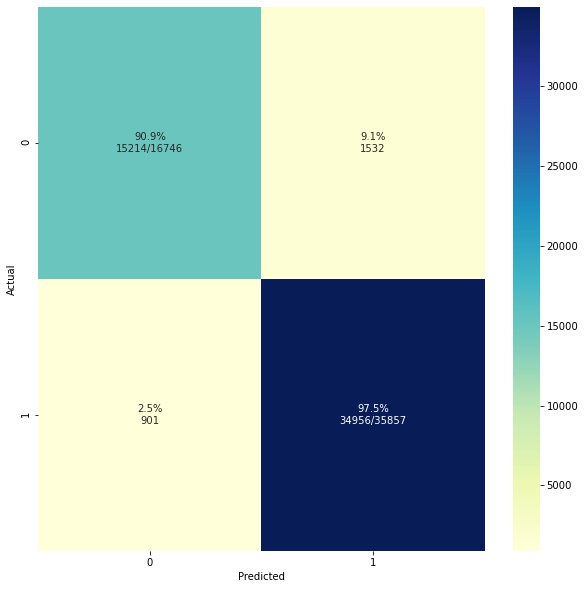

In [121]:
plot_cm(y_test, predictions)

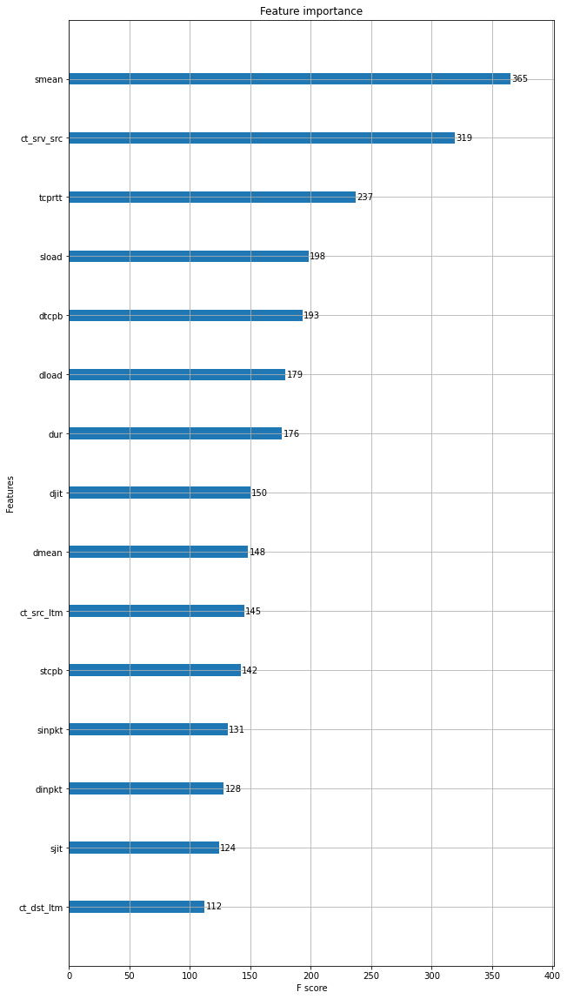

In [122]:
fig, ax = plt.subplots(figsize=(10, 20))
plot_importance(model, max_num_features=15, ax=ax)

In [83]:
X = X[['smean','ct_srv_src','tcprtt','sload','dtcpb','dload','dur','djit','dmean','ct_src_ltm']]

In [84]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=test_size, random_state=seed)

In [85]:
start_time = time()
clf = RandomForestClassifier(random_state=random_state)
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)
elapsed_time = time() - start_time

In [88]:
fn=X.columns
cn=df.attack_cat.unique()
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (100,100), dpi=800)
tree.plot_tree(clf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('rf_individualtree.png')

ValueError: Image size of 80000x80000 pixels is too large. It must be less than 2^16 in each direction.

ValueError: Image size of 80000x80000 pixels is too large. It must be less than 2^16 in each direction.

<Figure size 80000x80000 with 1 Axes>

In [15]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=test_size, random_state=seed)
model = XGBClassifier()
model.fit(X_train, y_train)
print(model)
predictions = model.predict(X_test)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [16]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions))
print('Recall',recall_score(y_test,predictions))
print('F1',f1_score(y_test,predictions))

[[15088  1658]
 [  908 34949]]
Accuracy 0.9512195121951219
Precision 0.954708115934111
Recall 0.9746771899489639
F1 0.9645893133141974


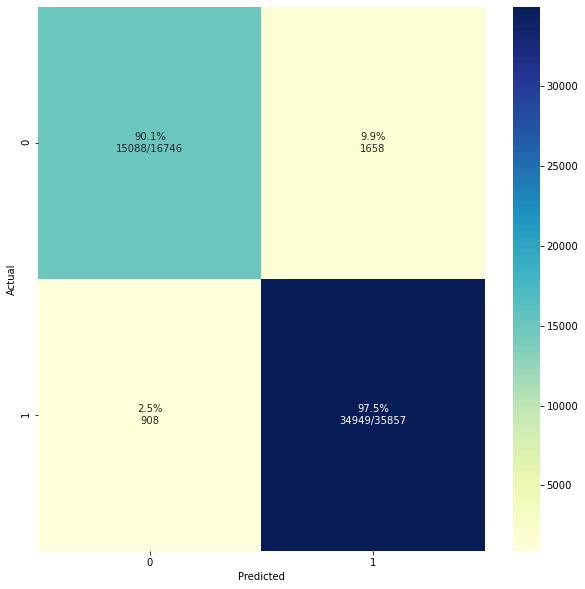

In [17]:
plot_cm(y_test, predictions)

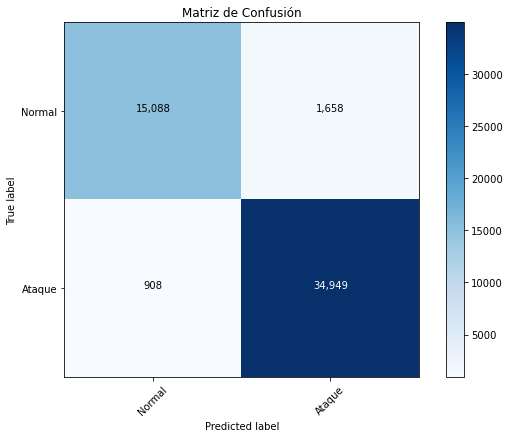

In [18]:
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Normal','Ataque'],
                      title        = "Matriz de Confusión")

(array([0, 1, 2, 3, 4]), <a list of 5 Text major ticklabel objects>)

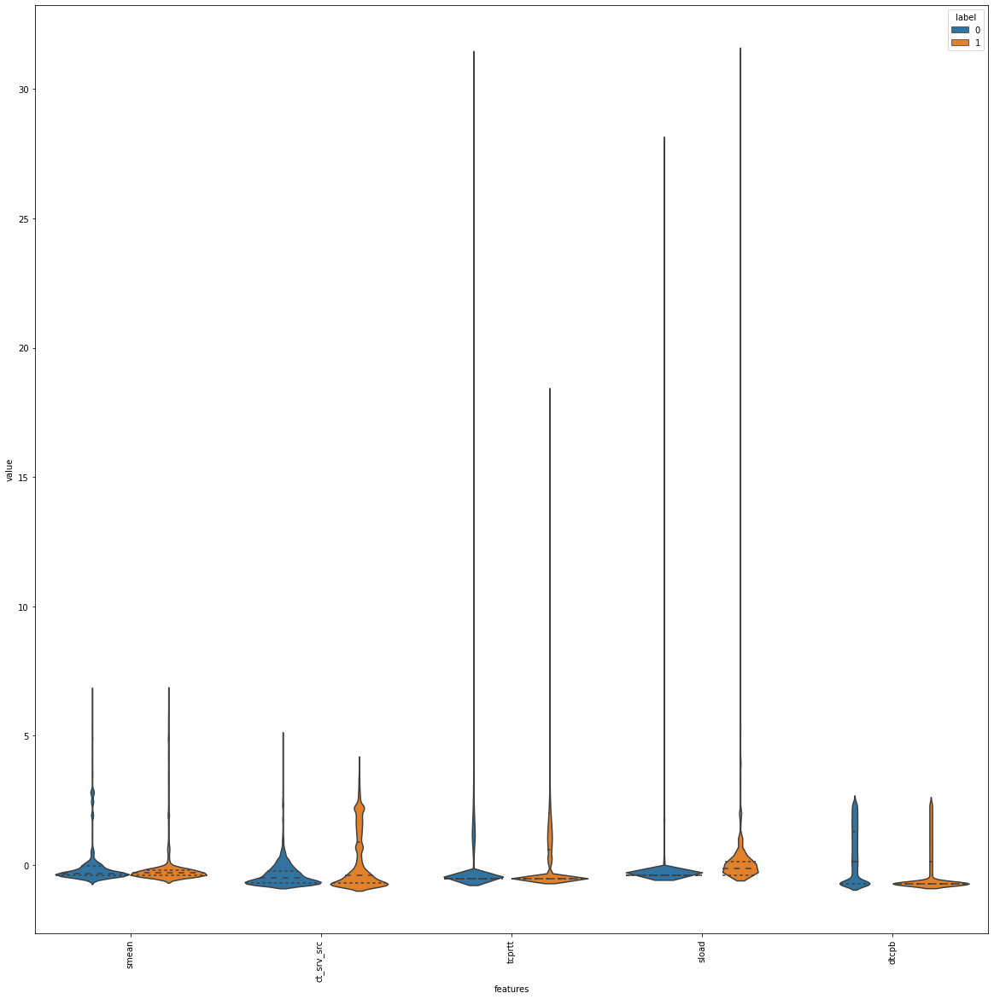

In [128]:
data_dia = Y
data = X
data_n_2 = (data - data.mean()) / (data.std())              # standardization
data = pd.concat([Y,data_n_2.iloc[:,0:5]],axis=1)
data = pd.melt(data,id_vars="label",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(20,20))
sns.violinplot(x="features", y="value", hue="label", data=data, inner="quart")
plt.xticks(rotation=90)

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

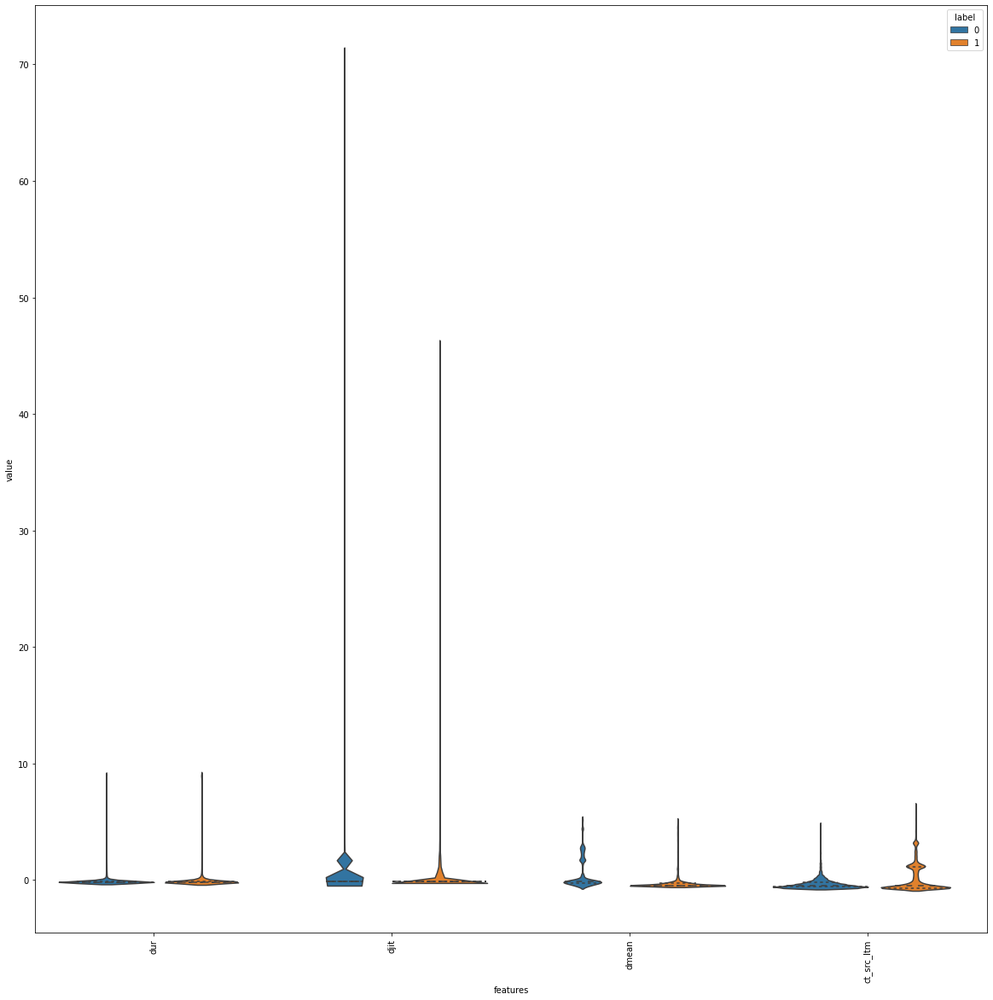

In [129]:
data_dia = Y
data = X
data_n_2 = (data - data.mean()) / (data.std())              # standardization
data = pd.concat([Y,data_n_2.iloc[:,6:10]],axis=1)
data = pd.melt(data,id_vars="label",
                    var_name="features",
                    value_name='value')
plt.figure(figsize=(20,20))
sns.violinplot(x="features", y="value", hue="label", data=data, inner="quart")
plt.xticks(rotation=90)

In [130]:
tsne = TSNE(n_components=2, verbose=2, perplexity=40, n_iter=1000)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 175341 samples in 3.861s...
[t-SNE] Computed neighbors for 175341 samples in 16.233s...
[t-SNE] Computed conditional probabilities for sample 1000 / 175341
[t-SNE] Computed conditional probabilities for sample 2000 / 175341
[t-SNE] Computed conditional probabilities for sample 3000 / 175341
[t-SNE] Computed conditional probabilities for sample 4000 / 175341
[t-SNE] Computed conditional probabilities for sample 5000 / 175341
[t-SNE] Computed conditional probabilities for sample 6000 / 175341
[t-SNE] Computed conditional probabilities for sample 7000 / 175341
[t-SNE] Computed conditional probabilities for sample 8000 / 175341
[t-SNE] Computed conditional probabilities for sample 9000 / 175341
[t-SNE] Computed conditional probabilities for sample 10000 / 175341
[t-SNE] Computed conditional probabilities for sample 11000 / 175341
[t-SNE] Computed conditional probabilities for sample 12000 / 175341
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities for sample 119000 / 175341
[t-SNE] Computed conditional probabilities for sample 120000 / 175341
[t-SNE] Computed conditional probabilities for sample 121000 / 175341
[t-SNE] Computed conditional probabilities for sample 122000 / 175341
[t-SNE] Computed conditional probabilities for sample 123000 / 175341
[t-SNE] Computed conditional probabilities for sample 124000 / 175341
[t-SNE] Computed conditional probabilities for sample 125000 / 175341
[t-SNE] Computed conditional probabilities for sample 126000 / 175341
[t-SNE] Computed conditional probabilities for sample 127000 / 175341
[t-SNE] Computed conditional probabilities for sample 128000 / 175341
[t-SNE] Computed conditional probabilities for sample 129000 / 175341
[t-SNE] Computed conditional probabilities for sample 130000 / 175341
[t-SNE] Computed conditional probabilities for sample 131000 / 175341
[t-SNE] Computed conditional probabilities for sample 132000 / 175341
[t-SNE] Computed con

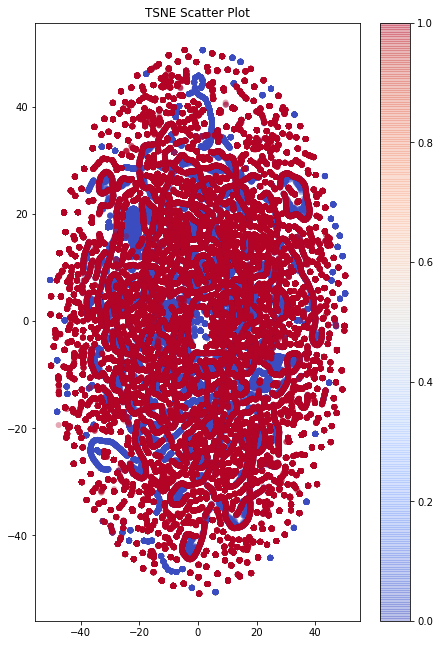

In [131]:
plt.figure(figsize = (16,11))
plt.subplot(122)
plt.scatter(tsne_results[:,0],tsne_results[:,1], c = Y,
            cmap = "coolwarm", edgecolor = "None", alpha=0.35)
plt.colorbar()
plt.title('TSNE Scatter Plot')
plt.show()

# Tipos de ataque

In [5]:
print('Leyendo el archivo csv')
df = pd.read_csv("D:\\jupyter\\csv\\UNSW_NB15_training-set.csv")
#dataframe11 = pd.read_csv("D:\\jupyter\\csv\\UNSW_NB15_testing-set.csv")
print('Concatenar los archivos')
#df = pd.concat([dataframe1, dataframe11])

Leyendo el archivo csv
Concatenar los archivos


In [6]:
df = df[df.label != 0]

In [7]:
df2 = df.drop(['id','label','is_sm_ips_ports'], axis = 1)
df2['proto'] = df2['proto'].astype('category')
df2['service'] = df2['service'].astype('category')
df2['state'] = df2['state'].astype('category')
df2['attack_cat'] = df2['attack_cat'].astype('category')

In [8]:
cat_columns = df2.select_dtypes(['category']).columns
cat_columns
df2[cat_columns] = df2[cat_columns].apply(lambda x: x.cat.codes)
#df2 = df2.drop(df2[df2['attack_cat'] == 6].index)

In [73]:
# tsne

In [10]:
generic = df2[df2['attack_cat'] == 5]
exploits = df2[df2['attack_cat'] == 3]
fuzzers = df2[df2['attack_cat'] == 4]
dos = df2[df2['attack_cat'] == 2]
reconn = df2[df2['attack_cat'] == 6]
analysis = df2[df2['attack_cat'] == 0]
backdoor = df2[df2['attack_cat'] == 1]
shell = df2[df2['attack_cat'] == 7]
worms = df2[df2['attack_cat'] == 8]

In [11]:
generic = generic.sample(n=1000,replace=False)
exploits = exploits.sample(n=1000,replace=False)
fuzzers = fuzzers.sample(n=1000,replace=False)
dos = dos.sample(n=1000,replace=False)
reconn = reconn.sample(n=1000,replace=False)
analysis = analysis.sample(n=1000,replace=False)
backdoor = backdoor.sample(n=1000,replace=False)
shell = shell.sample(n=1000,replace=False)

In [12]:
tsneX = pd.concat([generic,exploits,fuzzers,dos,reconn,analysis,backdoor,shell,worms])

In [13]:
tsneY = tsneX['attack_cat']

In [14]:
tsneX = tsneX.drop(columns = ['attack_cat'])

In [15]:
# 1 muestra

In [66]:
tsne = TSNE(n_components=2, verbose=2, perplexity=100, n_iter=3000)
tsne_results = tsne.fit_transform(tsneX)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8130 samples in 0.118s...
[t-SNE] Computed neighbors for 8130 samples in 1.082s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8130
[t-SNE] Computed conditional probabilities for sample 2000 / 8130
[t-SNE] Computed conditional probabilities for sample 3000 / 8130
[t-SNE] Computed conditional probabilities for sample 4000 / 8130
[t-SNE] Computed conditional probabilities for sample 5000 / 8130
[t-SNE] Computed conditional probabilities for sample 6000 / 8130
[t-SNE] Computed conditional probabilities for sample 7000 / 8130
[t-SNE] Computed conditional probabilities for sample 8000 / 8130
[t-SNE] Computed conditional probabilities for sample 8130 / 8130
[t-SNE] Mean sigma: 6.643915
[t-SNE] Computed conditional probabilities in 5.534s
[t-SNE] Iteration 50: error = 72.0049286, gradient norm = 0.0282785 (50 iterations in 2.276s)
[t-SNE] Iteration 100: error = 58.0161858, gradient norm = 0.0055928 (50 iterations in 2

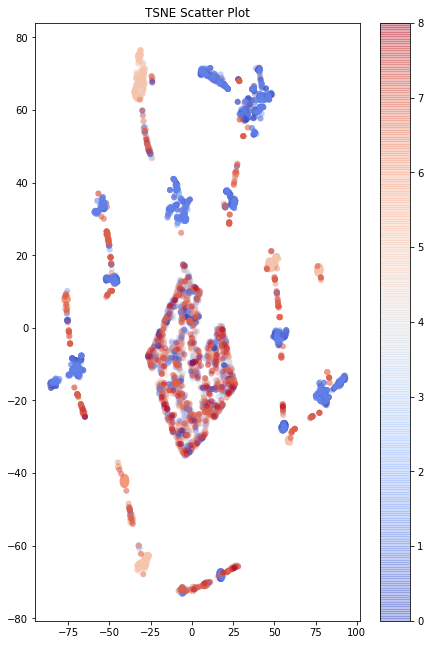

In [67]:
plt.figure(figsize = (16,11))
plt.subplot(122)
plt.scatter(tsne_results[:,0],tsne_results[:,1], c = tsneY,
            cmap = "coolwarm", edgecolor = "None", alpha=0.35)
plt.colorbar()
plt.title('TSNE Scatter Plot')
plt.show()

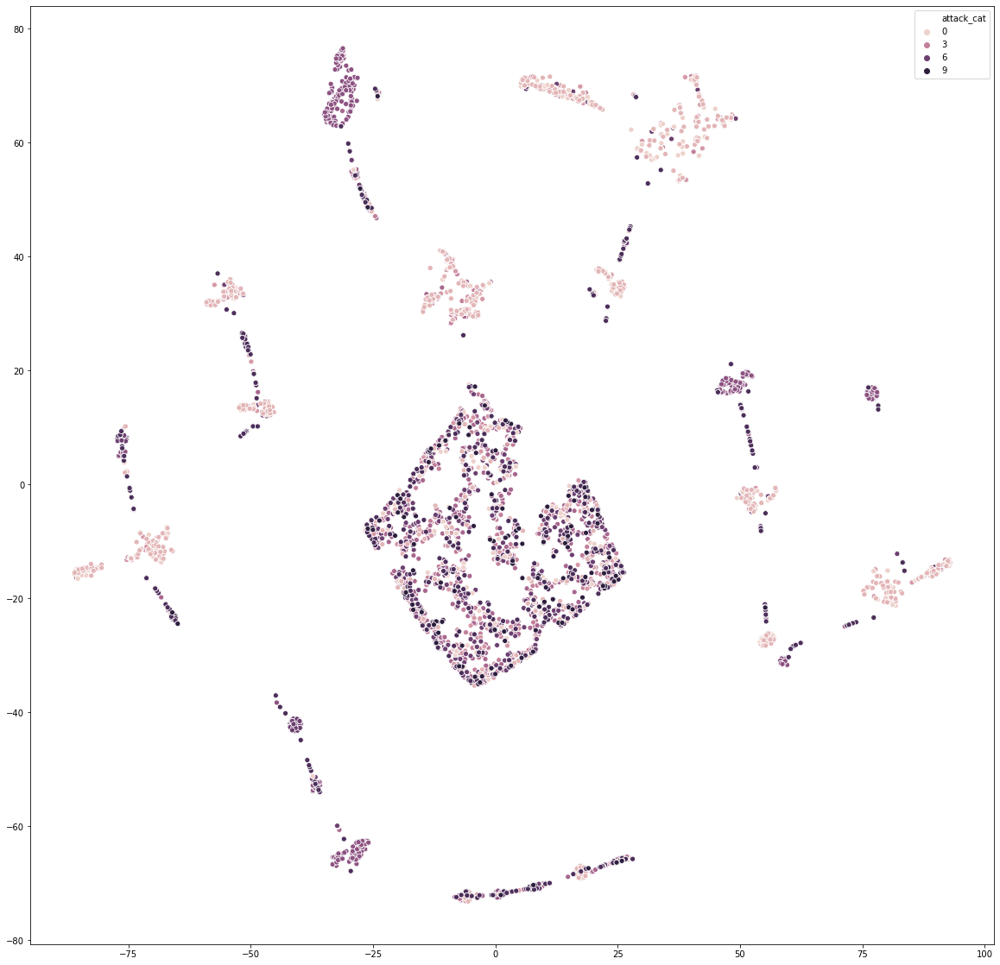

In [68]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = tsneY);

In [ ]:
# 2 muestra

In [90]:
tsne = TSNE(n_components=2, verbose=2, perplexity=30, n_iter=3000)
tsne_results = tsne.fit_transform(tsneX)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8130 samples in 0.127s...
[t-SNE] Computed neighbors for 8130 samples in 0.551s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8130
[t-SNE] Computed conditional probabilities for sample 2000 / 8130
[t-SNE] Computed conditional probabilities for sample 3000 / 8130
[t-SNE] Computed conditional probabilities for sample 4000 / 8130
[t-SNE] Computed conditional probabilities for sample 5000 / 8130
[t-SNE] Computed conditional probabilities for sample 6000 / 8130
[t-SNE] Computed conditional probabilities for sample 7000 / 8130
[t-SNE] Computed conditional probabilities for sample 8000 / 8130
[t-SNE] Computed conditional probabilities for sample 8130 / 8130
[t-SNE] Mean sigma: 3.578385
[t-SNE] Computed conditional probabilities in 1.468s
[t-SNE] Iteration 50: error = 86.6943893, gradient norm = 0.0278614 (50 iterations in 1.653s)
[t-SNE] Iteration 100: error = 70.2344818, gradient norm = 0.0078754 (50 iterations in 1.

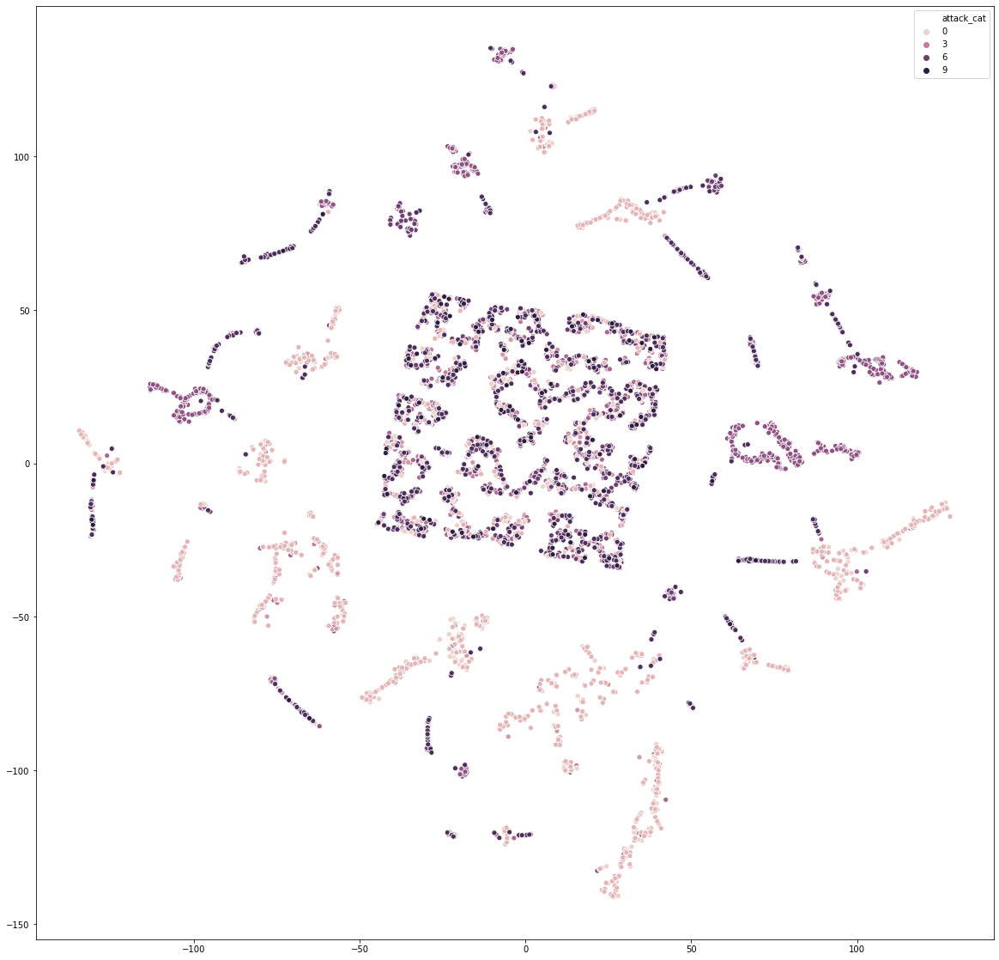

In [91]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = tsneY);

In [ ]:
# 3 muestra

In [102]:
tsne = TSNE(n_components=2, verbose=2, perplexity=30, n_iter=3000)
tsne_results = tsne.fit_transform(tsneX)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8130 samples in 0.125s...
[t-SNE] Computed neighbors for 8130 samples in 0.526s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8130
[t-SNE] Computed conditional probabilities for sample 2000 / 8130
[t-SNE] Computed conditional probabilities for sample 3000 / 8130
[t-SNE] Computed conditional probabilities for sample 4000 / 8130
[t-SNE] Computed conditional probabilities for sample 5000 / 8130
[t-SNE] Computed conditional probabilities for sample 6000 / 8130
[t-SNE] Computed conditional probabilities for sample 7000 / 8130
[t-SNE] Computed conditional probabilities for sample 8000 / 8130
[t-SNE] Computed conditional probabilities for sample 8130 / 8130
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 1.443s
[t-SNE] Iteration 50: error = 86.2884750, gradient norm = 0.0284295 (50 iterations in 2.154s)
[t-SNE] Iteration 100: error = 70.2163162, gradient norm = 0.0073806 (50 iterations in 1.

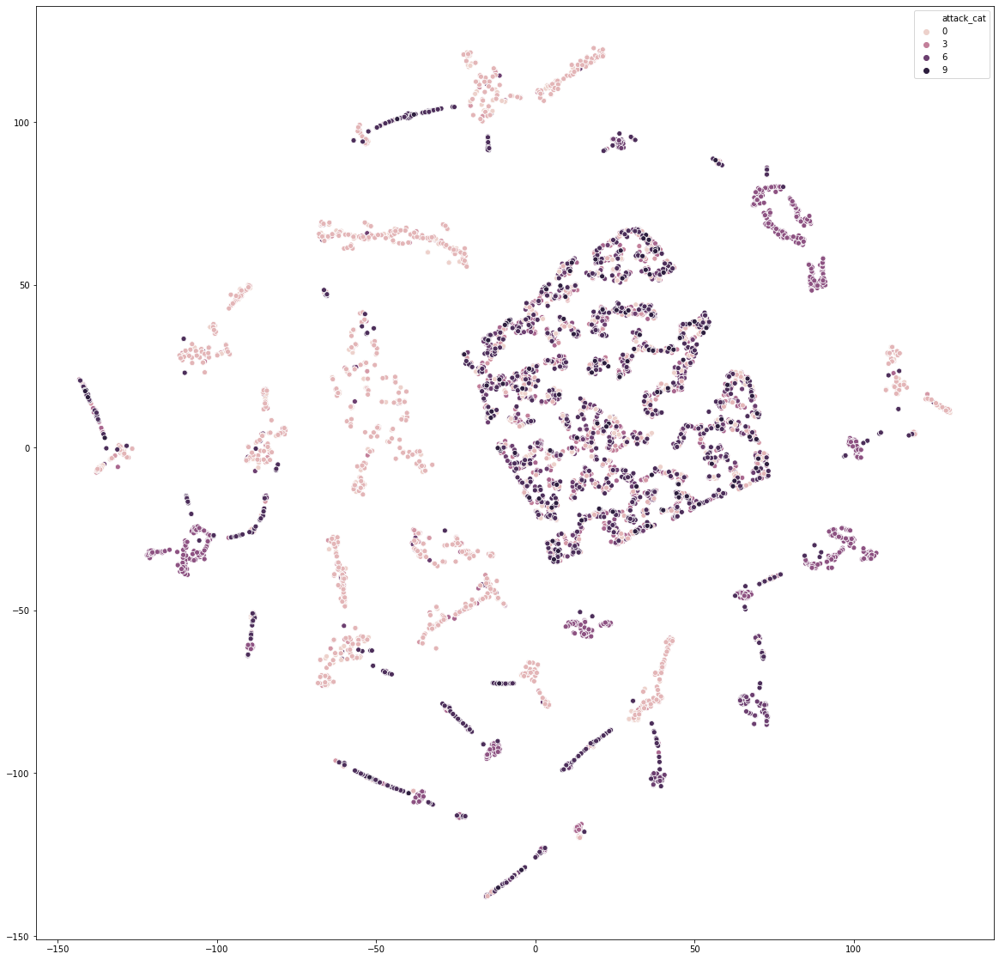

In [113]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = tsneY);

In [ ]:
# 4 muestra

In [16]:
tsne = TSNE(n_components=2, verbose=2, perplexity=100, n_iter=3000)
tsne_results = tsne.fit_transform(tsneX)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 8130 samples in 0.098s...
[t-SNE] Computed neighbors for 8130 samples in 0.842s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8130
[t-SNE] Computed conditional probabilities for sample 2000 / 8130
[t-SNE] Computed conditional probabilities for sample 3000 / 8130
[t-SNE] Computed conditional probabilities for sample 4000 / 8130
[t-SNE] Computed conditional probabilities for sample 5000 / 8130
[t-SNE] Computed conditional probabilities for sample 6000 / 8130
[t-SNE] Computed conditional probabilities for sample 7000 / 8130
[t-SNE] Computed conditional probabilities for sample 8000 / 8130
[t-SNE] Computed conditional probabilities for sample 8130 / 8130
[t-SNE] Mean sigma: 7.601825
[t-SNE] Computed conditional probabilities in 4.906s
[t-SNE] Iteration 50: error = 74.0026398, gradient norm = 0.0337062 (50 iterations in 2.303s)
[t-SNE] Iteration 100: error = 58.3979874, gradient norm = 0.0059396 (50 iterations in 1

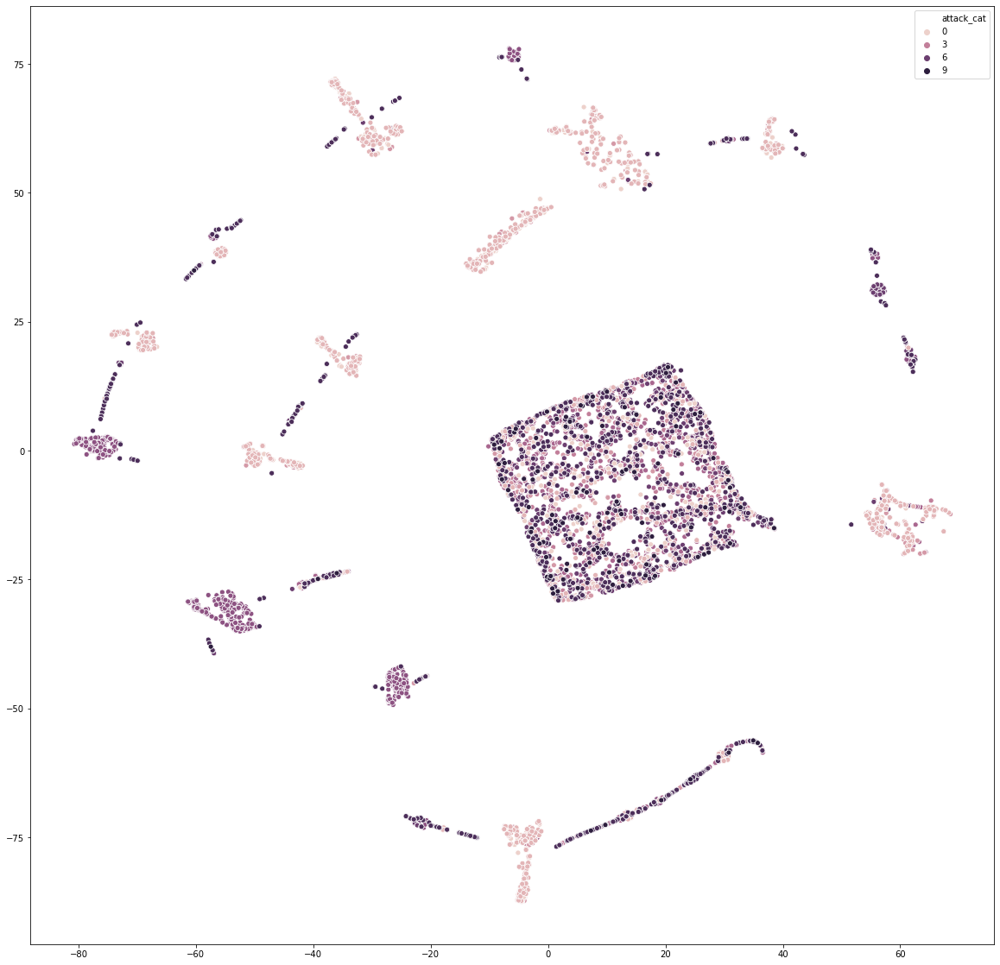

In [19]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = tsneY);

In [ ]:
# 5 muestra

In [ ]:
tsne = TSNE(n_components=2, verbose=2, perplexity=100, n_iter=3000)
tsne_results = tsne.fit_transform(tsneX)

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = tsneY);

In [9]:
Y = df2['attack_cat']
X = df2.drop(columns=['attack_cat'])

In [28]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=test_size, random_state=seed)

In [29]:
from time import time

In [30]:
from sklearn.tree import DecisionTreeClassifier
start_time = time()
clf = DecisionTreeClassifier(random_state=random_state)
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)  
elapsed_time = time() - start_time
print("Elapsed time: %.10f seconds." % elapsed_time)

Elapsed time: 1.1286709309 seconds.


Accuracy 0.785492835795883
Precision 0.7910564874099487
Recall 0.785492835795883
F1 0.7813487492659478


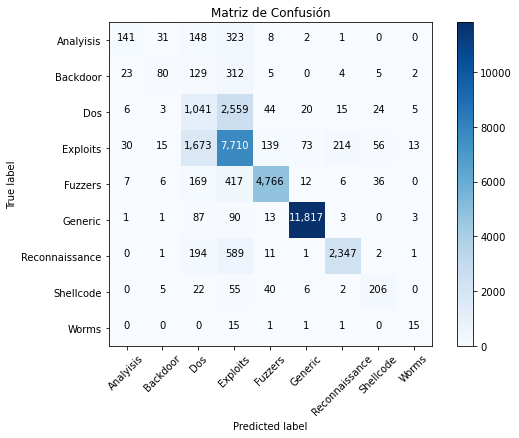

In [31]:
cm = confusion_matrix(y_test,predictions)
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions, average = 'weighted'))
print('Recall',recall_score(y_test,predictions, average = 'weighted'))
print('F1',f1_score(y_test,predictions, average = 'weighted'))
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Analyisis','Backdoor','Dos','Exploits','Fuzzers','Generic','Reconnaissance','Shellcode','Worms'],
                      title        = "Matriz de Confusión")

In [64]:
df.attack_cat.unique()

array(['Backdoor', 'Analysis', 'Fuzzers', 'Shellcode', 'Reconnaissance',
       'Exploits', 'DoS', 'Worms', 'Generic'], dtype=object)

In [52]:
from sklearn import tree
from sklearn.tree import plot_tree

In [ ]:
plt.figure(figsize=(300,300))
a = plot_tree(clf, 
              feature_names=X.columns, 
              class_names=df.attack_cat.unique(), 
              filled=True, 
              rounded=True, 
              fontsize=14)

In [27]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, confusion_matrix
from sklearn.metrics import roc_auc_score

In [23]:
clfs = {
    'mnb': MultinomialNB(),
    'gnb': GaussianNB(),
    'mlp1': MLPClassifier(),
    'mlp2': MLPClassifier(hidden_layer_sizes=[100, 100]),
    'ada': AdaBoostClassifier(),
    'dtc': DecisionTreeClassifier(),
    'rfc': RandomForestClassifier(),
    'gbc': GradientBoostingClassifier(),
    'lr': LogisticRegression()
}

In [31]:
f1_scores = dict()
acu = dict()
for clf_name in clfs:
    print(clf_name)
    clf = clfs[clf_name]
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    f1_scores[clf_name] = f1_score(y_pred, y_test, average = 'weighted')
    acu[clf_name] = accuracy_score(y_pred, y_test)

mnb
gnb
mlp1
mlp2
ada
dtc
rfc
gbc
lr


D:\Anaconda\lib\site-packages\sklearn\linear_model\_logistic.py:762: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [26]:
f1_scores

{'mnb': 0.4868637910399656,
 'gnb': 0.5262249802590097,
 'mlp1': 0.5647814023799177,
 'mlp2': 0.5021791096594572,
 'ada': 0.5521742604799466,
 'dtc': 0.7890533535612226,
 'rfc': 0.8136429947773635,
 'gbc': 0.8481346466797719,
 'lr': 0.6229499852914434}

In [12]:
from sklearn.ensemble import RandomForestClassifier

In [68]:
start_time = time()
clf = RandomForestClassifier(random_state=random_state)
clf.fit(X_train, y_train)
predictions = clf.predict(X_test)
elapsed_time = time() - start_time
print("Elapsed time: %.10f seconds." % elapsed_time)

Elapsed time: 12.1692681313 seconds.


Accuracy 0.8017763874535654
Precision 0.8005699517285758
Recall 0.8017763874535654
F1 0.7899229811034728


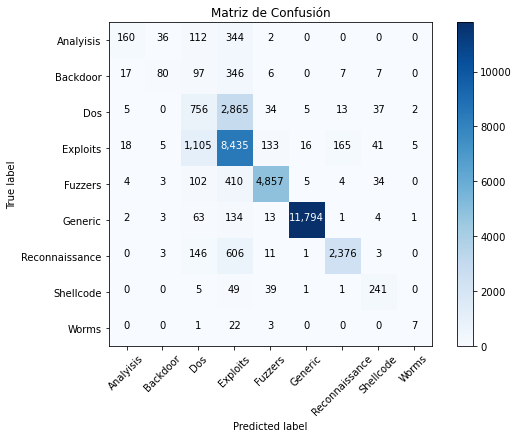

In [69]:
cm = confusion_matrix(y_test,predictions)
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions, average = 'weighted'))
print('Recall',recall_score(y_test,predictions, average = 'weighted'))
print('F1',f1_score(y_test,predictions, average = 'weighted'))
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Analyisis','Backdoor','Dos','Exploits','Fuzzers','Generic','Reconnaissance','Shellcode','Worms'],
                      title        = "Matriz de Confusión")

In [70]:
from sklearn.tree import export_graphviz

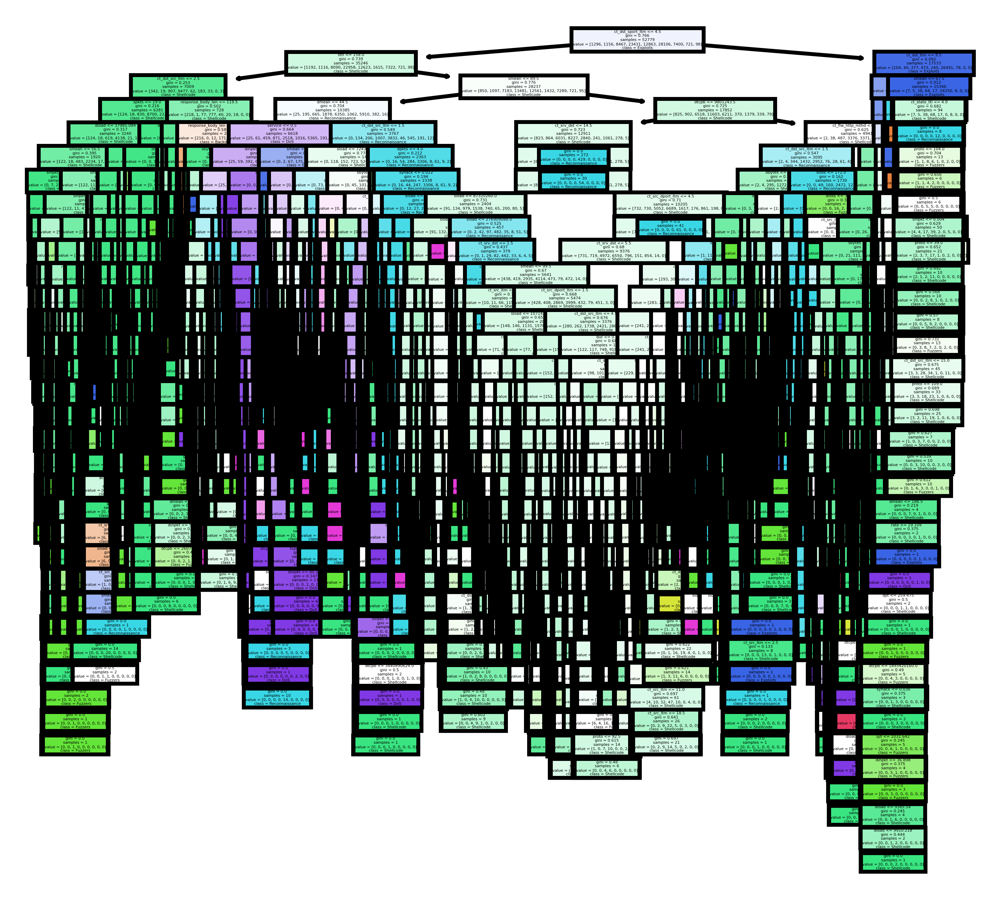

In [73]:
fn=X.columns
cn=df.attack_cat.unique()
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(clf.estimators_[0],
               feature_names = fn, 
               class_names=cn,
               filled = True);
fig.savefig('rf_individualtree.png')

In [29]:
model = XGBClassifier()
start_time = time()
model.fit(X_train, y_train)
print(model)
predictions = model.predict(X_test)
elapsed_time = time() - start_time
print("Elapsed time: %.10f seconds." % elapsed_time)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=9, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)
Elapsed time: 289.3825550079 seconds.


In [31]:
print('Leyendo el archivo csv')
df = pd.read_csv("D:\\jupyter\\csv\\UNSW_NB15_training-set.csv")
dataframe11 = pd.read_csv("D:\\jupyter\\csv\\UNSW_NB15_testing-set.csv")
print('Concatenar los archivos')
df = pd.concat([df, dataframe11])

Leyendo el archivo csv
Concatenar los archivos


In [32]:
df = df[df.label != 0]

In [33]:
df2 = df.drop(['id','label','is_sm_ips_ports'], axis = 1)
df2['proto'] = df2['proto'].astype('category')
df2['service'] = df2['service'].astype('category')
df2['state'] = df2['state'].astype('category')
df2['attack_cat'] = df2['attack_cat'].astype('category')

In [34]:
cat_columns = df2.select_dtypes(['category']).columns
cat_columns
df2[cat_columns] = df2[cat_columns].apply(lambda x: x.cat.codes)
#df2 = df2.drop(df2[df2['attack_cat'] == 6].index)

In [35]:
test = df2.tail(82332)


In [36]:
generic = test[test['attack_cat'] == 5]
exploits = test[test['attack_cat'] == 3]
fuzzers = test[test['attack_cat'] == 4]
dos = test[test['attack_cat'] == 2]
reconn = test[test['attack_cat'] == 6]
analysis = test[test['attack_cat'] == 0]
backdoor = test[test['attack_cat'] == 1]
shell = test[test['attack_cat'] == 7]
worms = test[test['attack_cat'] == 8]

In [49]:
testing = pd.concat([generic,exploits,fuzzers,dos,reconn,analysis,backdoor,shell,worms])

In [45]:
testing = testing.drop(['attack_cat'], axis=1)

In [51]:
y_test = testing.attack_cat

In [47]:
predictions = model.predict(testing)

In [52]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions, average = 'weighted'))
print('Recall',recall_score(y_test,predictions, average = 'weighted'))
print('F1',f1_score(y_test,predictions, average = 'weighted'))

[[  106   109    83   511    68     6     0     0     0]
 [   37   128    85   440    68     6     0     7     1]
 [  190   802   832  3472   127    16    28    40     0]
 [  263   808   391 12902   285    35   209    95     7]
 [   90   217   179  1065  6585    20     8   234     0]
 [    0     6    61   651    41 45623     1    21     6]
 [   23   102    51   691    17     1  3881    24     1]
 [    0     1     6    28    37     0     1   446     0]
 [    0     0     1    27     1     1     0     0    27]]
Accuracy 0.8566535490453286
Precision 0.8678174253274797
Recall 0.8566535490453286
F1 0.8522260178627212


In [30]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions, average = 'weighted'))
print('Recall',recall_score(y_test,predictions, average = 'weighted'))
print('F1',f1_score(y_test,predictions, average = 'weighted'))

[[  148    27    40   438     1     0     0     0     0]
 [    9    76    32   424     2     1     5    10     1]
 [    2     0   400  3245    29     6     9    25     1]
 [   19     5   372  9198    94    18   165    44     8]
 [    5     3    37   454  4882     5     5    28     0]
 [    0     1    19   173    11 11807     1     2     1]
 [    0     3    67   698     8     1  2368     1     0]
 [    0     0     2    34    29     0     0   271     0]
 [    0     0     1    19     0     0     0     0    13]]
Accuracy 0.8145406809485238
Precision 0.8110739384499621
Recall 0.8145406809485238
F1 0.7887528214701506


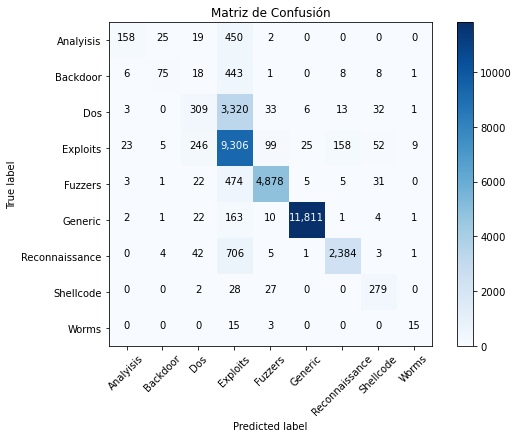

In [17]:
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Analyisis','Backdoor','Dos','Exploits','Fuzzers','Generic','Reconnaissance','Shellcode','Worms'],
                      title        = "Matriz de Confusión")

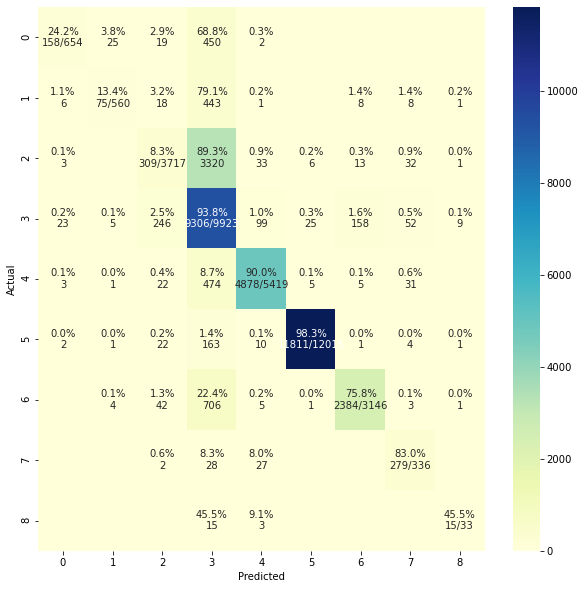

In [14]:
plot_cm(y_test, predictions)

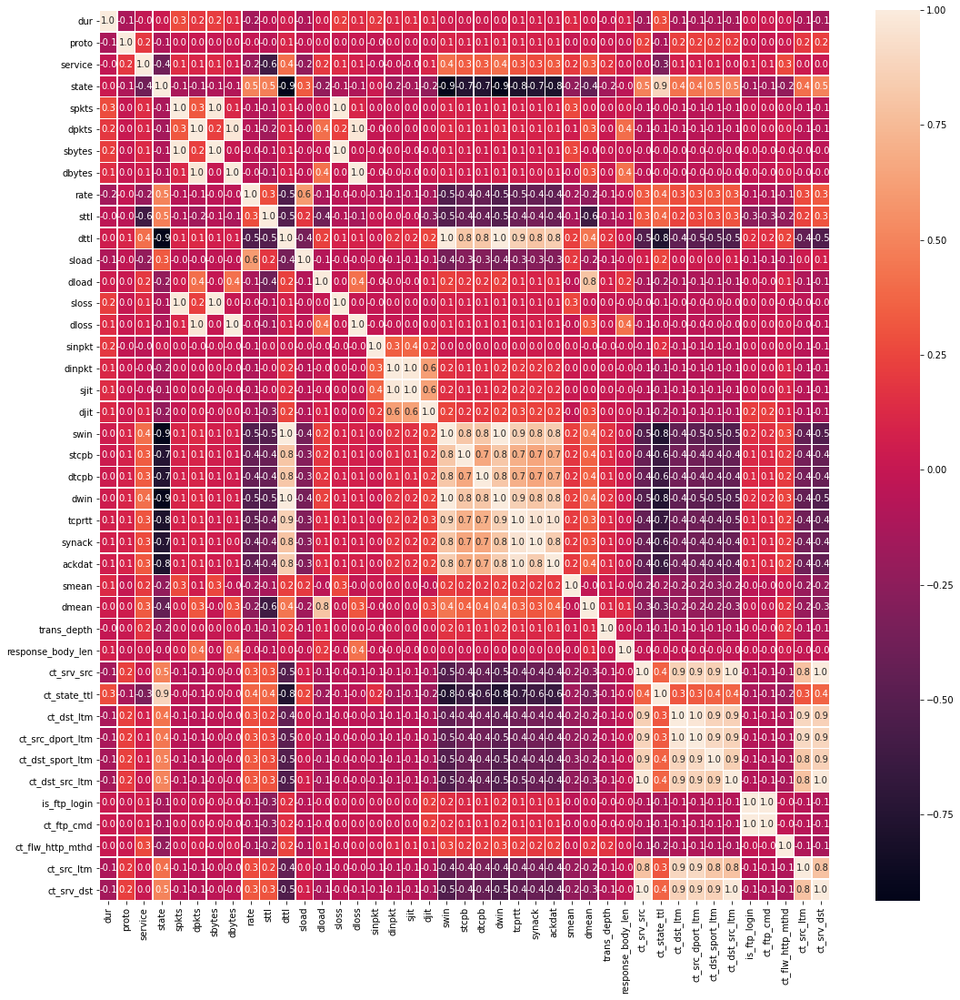

In [19]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [20]:
# Create correlation matrix
corr_matrix = X.corr().abs()

In [21]:
# Select upper triangle of correlation matrix
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

In [22]:

# Find index of feature columns with correlation greater than 0.95
to_drop = [column for column in upper.columns if any(upper[column] > 0.95)]

In [23]:
X = X.drop(X[to_drop], axis=1)

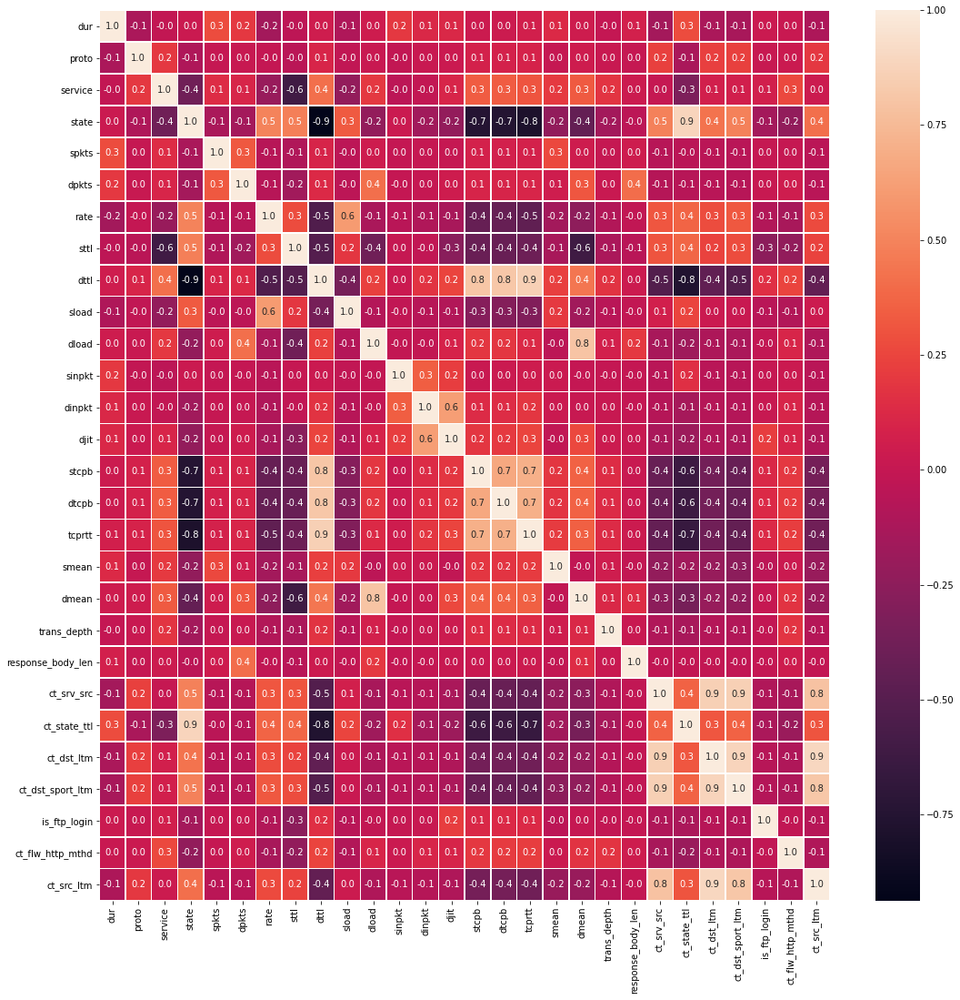

In [24]:
f,ax = plt.subplots(figsize=(18, 18))
sns.heatmap(X.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=test_size, random_state=seed)

In [26]:
model = XGBClassifier()
model.fit(X_train, y_train)
print(model)
predictions = model.predict(X_test)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.300000012, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=100, n_jobs=0, num_parallel_tree=1,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [27]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions, average = 'weighted'))
print('Recall',recall_score(y_test,predictions, average = 'weighted'))
print('F1',f1_score(y_test,predictions, average = 'weighted'))

[[  149    27    18   459     1     0     0     0     0]
 [    4    76    16   443     3     1     8     7     2]
 [    5     0   290  3319    61     4    13    24     1]
 [   19     3   250  9217   208    19   159    39     9]
 [    3     1    22   479  4858     7    14    35     0]
 [    0     0    20   173    18 11799     1     2     2]
 [    0     3    40   706     8     1  2386     2     0]
 [    0     0     2    32    87     0     1   214     0]
 [    0     0     1    15     4     0     0     0    13]]
Accuracy 0.8100438510739324
Precision 0.8063657038921844
Recall 0.8100438510739324
F1 0.7797870549101128


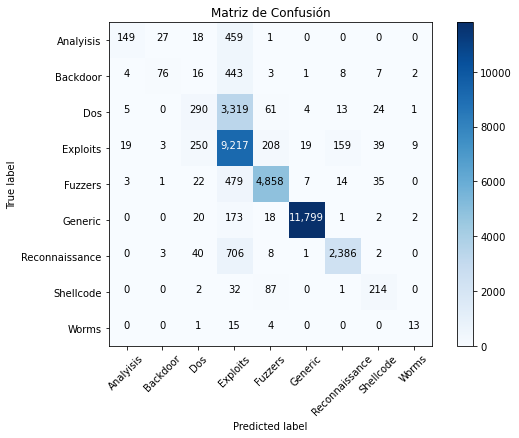

In [28]:
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Analyisis','Backdoor','Dos','Exploits','Fuzzers','Generic','Reconnaissance','Shellcode','Worms'],
                      title        = "Matriz de Confusión")

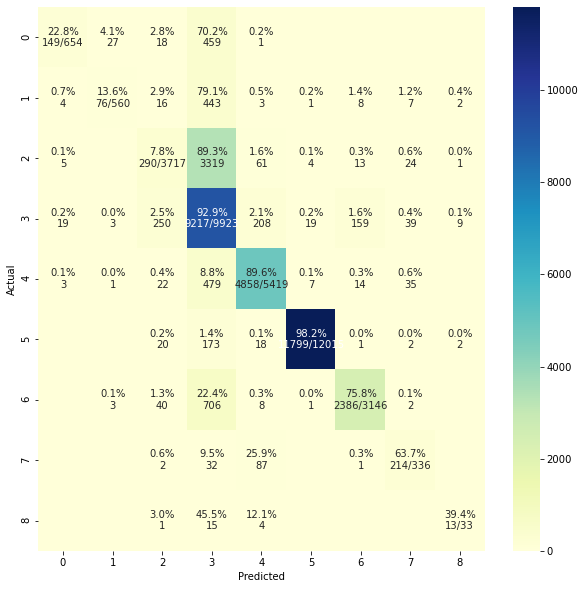

In [29]:
plot_cm(y_test, predictions)

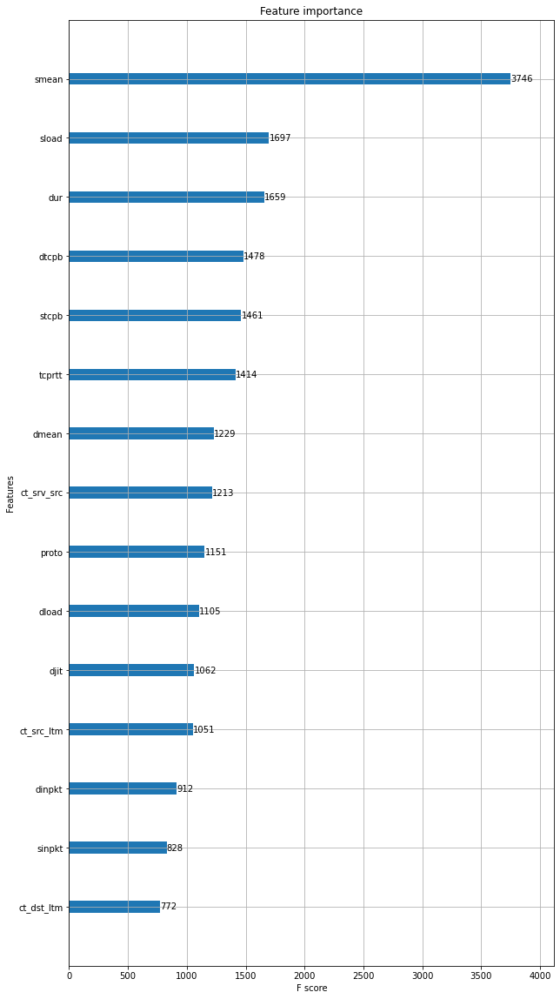

In [29]:
fig, ax = plt.subplots(figsize=(10, 20))
plot_importance(model, max_num_features=15, ax=ax)

In [30]:
# seleccionar las 10 variables mas importantes para una nueva X

In [10]:
X = X[['smean','sload','dur','dtcpb','stcpb','tcprtt','dmean','ct_srv_src','proto','dload']]

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=test_size, random_state=seed)
model = XGBClassifier(**params)
model.fit(X_train, y_train)
print(model)
predictions = model.predict(X_test)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
              importance_type='gain', interaction_constraints='',
              learning_rate=0.1, max_delta_step=0, max_depth=5,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=1000, n_jobs=4, nthread=4, num_parallel_tree=1,
              objective='multi:softprob', random_state=9, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=None, subsample=1,
              tree_method='exact', validate_parameters=1, verbosity=None)


In [12]:
cm = confusion_matrix(y_test,predictions)
print(confusion_matrix(y_test,predictions))
print('Accuracy',accuracy_score(y_test,predictions))
print('Precision',precision_score(y_test, predictions, average = 'weighted'))
print('Recall',recall_score(y_test,predictions, average = 'weighted'))
print('F1',f1_score(y_test,predictions, average = 'weighted'))

[[  147     7    25   474     1     0     0     0     0]
 [    2    43    15   481     5     0    10     3     1]
 [    3     2   209  3398    53     6    22    23     1]
 [   17     5   197  9276   206    19   160    33    10]
 [    5     2    19   527  4798    12    21    35     0]
 [    0     0     5   218    22 11767     1     1     1]
 [    0     2    35   749    20     0  2333     7     0]
 [    0     0     8    64    86     2    11   165     0]
 [    0     0     0    23     4     0     0     0     6]]
Accuracy 0.8028377510264503
Precision 0.798279407651367
Recall 0.8028377510264503
F1 0.7691048819763365


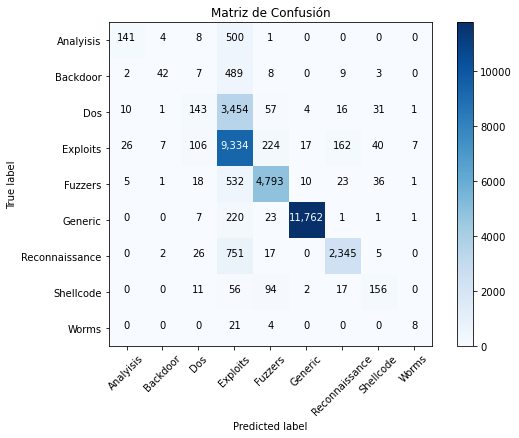

In [33]:
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Analyisis','Backdoor','Dos','Exploits','Fuzzers','Generic','Reconnaissance','Shellcode','Worms'],
                      title        = "Matriz de Confusión")

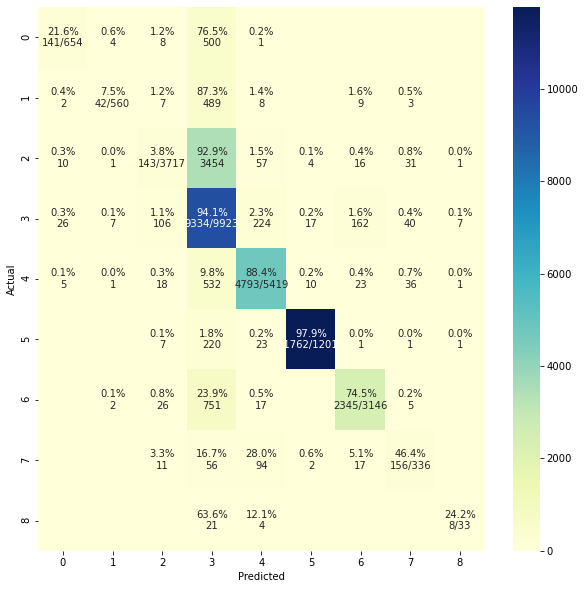

In [34]:
plot_cm(y_test, predictions)

In [35]:
# TSNE

In [37]:
tsne = TSNE(n_components=2, verbose=2, perplexity=100, n_iter=2000)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 119341 samples in 1.464s...
[t-SNE] Computed neighbors for 119341 samples in 8.234s...
[t-SNE] Computed conditional probabilities for sample 1000 / 119341
[t-SNE] Computed conditional probabilities for sample 2000 / 119341
[t-SNE] Computed conditional probabilities for sample 3000 / 119341
[t-SNE] Computed conditional probabilities for sample 4000 / 119341
[t-SNE] Computed conditional probabilities for sample 5000 / 119341
[t-SNE] Computed conditional probabilities for sample 6000 / 119341
[t-SNE] Computed conditional probabilities for sample 7000 / 119341
[t-SNE] Computed conditional probabilities for sample 8000 / 119341
[t-SNE] Computed conditional probabilities for sample 9000 / 119341
[t-SNE] Computed conditional probabilities for sample 10000 / 119341
[t-SNE] Computed conditional probabilities for sample 11000 / 119341
[t-SNE] Computed conditional probabilities for sample 12000 / 119341
[t-SNE] Computed conditional probab

[t-SNE] Computed conditional probabilities for sample 118000 / 119341
[t-SNE] Computed conditional probabilities for sample 119000 / 119341
[t-SNE] Computed conditional probabilities for sample 119341 / 119341
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 29.997s
[t-SNE] Iteration 50: error = 119.6654434, gradient norm = 0.0000012 (50 iterations in 42.226s)
[t-SNE] Iteration 100: error = 119.3806686, gradient norm = 0.0013625 (50 iterations in 45.246s)
[t-SNE] Iteration 150: error = 95.4799042, gradient norm = 0.0014309 (50 iterations in 35.979s)
[t-SNE] Iteration 200: error = 88.1484070, gradient norm = 0.0010073 (50 iterations in 34.958s)
[t-SNE] Iteration 250: error = 82.6005936, gradient norm = 0.0007769 (50 iterations in 33.881s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.600594
[t-SNE] Iteration 300: error = 4.4023933, gradient norm = 0.0006861 (50 iterations in 33.462s)
[t-SNE] Iteration 350: error = 4.1115689, gradient no

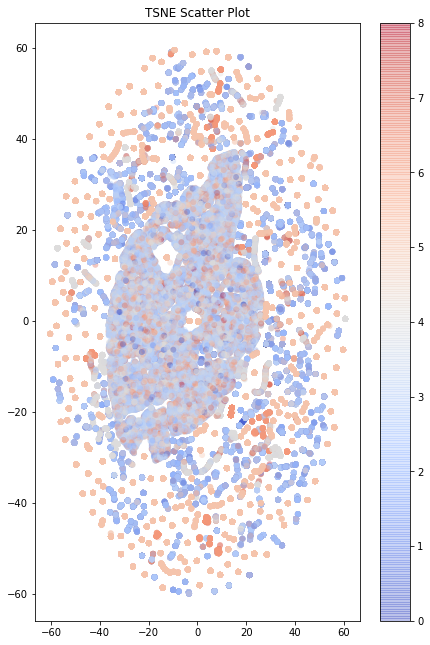

In [38]:
plt.figure(figsize = (16,11))
plt.subplot(122)
plt.scatter(tsne_results[:,0],tsne_results[:,1], c = Y,
            cmap = "coolwarm", edgecolor = "None", alpha=0.35)
plt.colorbar()
plt.title('TSNE Scatter Plot')
plt.show()

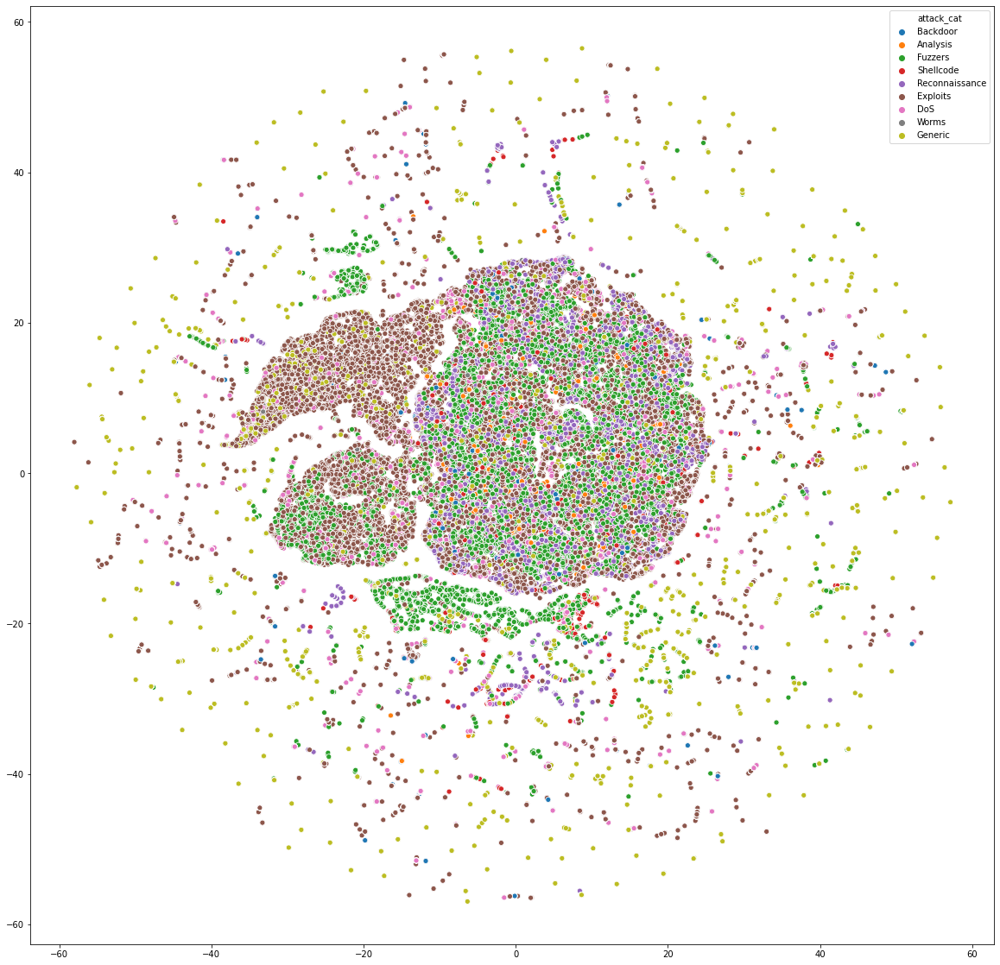

In [42]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results_std[:,0],tsne_results_std[:,1], hue = df.attack_cat);

In [11]:
bi = Y.unique()

In [12]:
ataque = ['back','analy','fuzz','shell','recon','exploits','dos','worm','generic']

In [13]:
for i in range(len(bi)):
    df2[ataque[i]] = (df2['attack_cat'] == bi[i]).astype(int)

In [14]:
Y = df2.iloc[:,42:53]

In [15]:
Y

,back,analy,fuzz,shell,recon,exploits,dos,worm,generic
47911,1,0,0,0,0,0,0,0,0
47912,1,0,0,0,0,0,0,0,0
47913,1,0,0,0,0,0,0,0,0
47914,1,0,0,0,0,0,0,0,0
47915,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
175336,0,0,0,0,0,0,0,0,1
175337,0,0,0,1,0,0,0,0,0
175338,0,0,0,0,0,0,0,0,1
175339,0,0,0,0,0,0,0,0,1


In [15]:
A = [0,1,2,3,4,5,6,7,8]

back
0    117595
1      1746
Name: back, dtype: int64
Accuracy 0.9853084937016451
analy
0    117341
1      2000
Name: analy, dtype: int64
Accuracy 0.9847219506745245
fuzz
0    101157
1     18184
Name: fuzz, dtype: int64
Accuracy 0.9709521548473592
shell
0    118208
1      1133
Name: shell, dtype: int64
Accuracy 0.9919559813423456
recon
0    108850
1     10491
Name: recon, dtype: int64
Accuracy 0.9708683629863419
exploits
0    85948
1    33393
Name: exploits, dtype: int64
Accuracy 0.841186492752004
dos
0    107077
1     12264
Name: dos, dtype: int64
Accuracy 0.8966846353657515
worm
0    119211
1       130
Name: worm, dtype: int64
Accuracy 0.998938636427115
generic
0    79341
1    40000
Name: generic, dtype: int64
Accuracy 0.9920677038237019


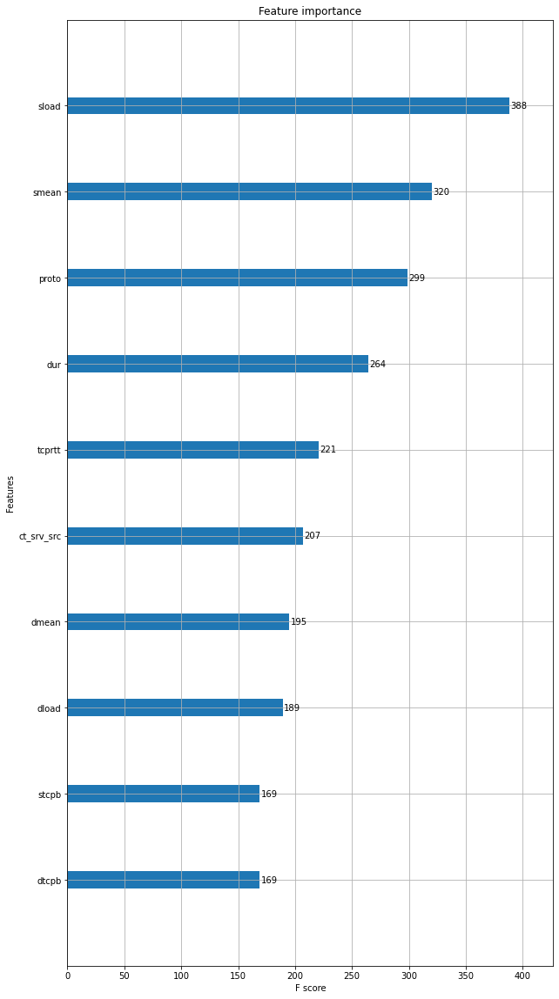

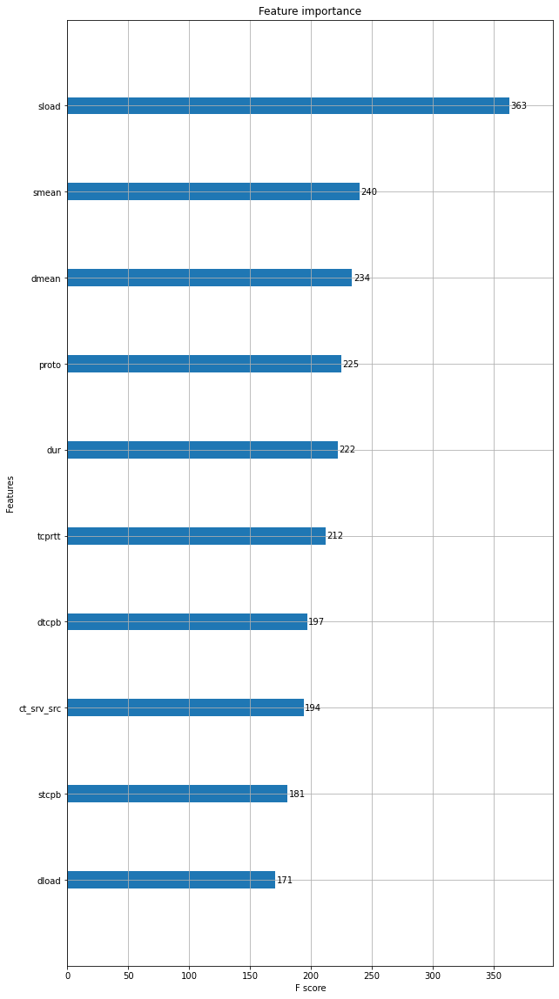

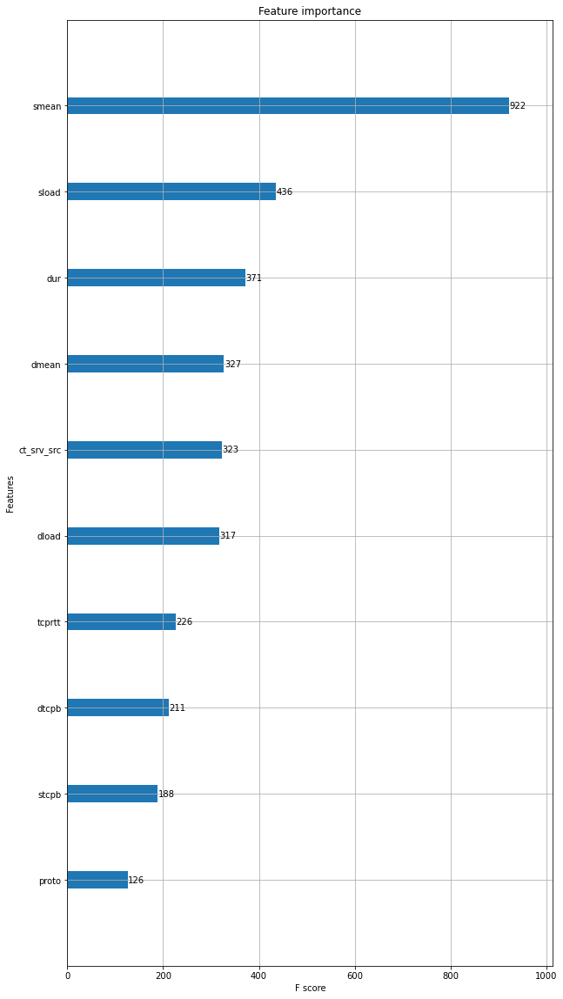

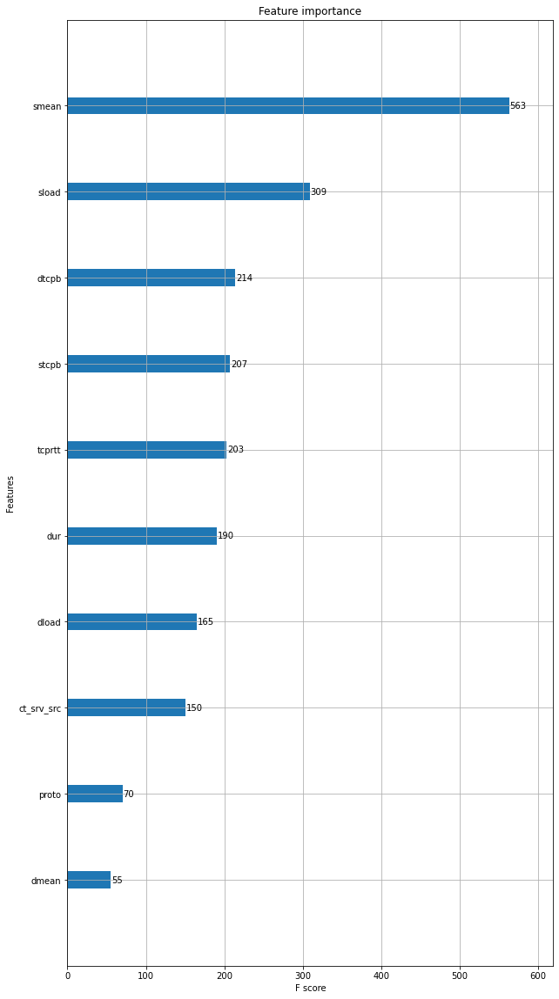

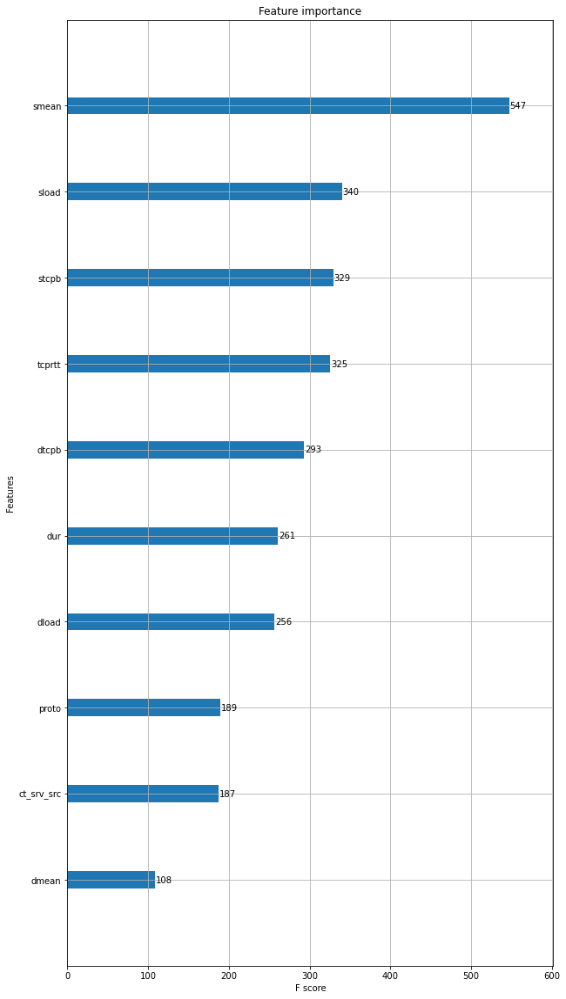

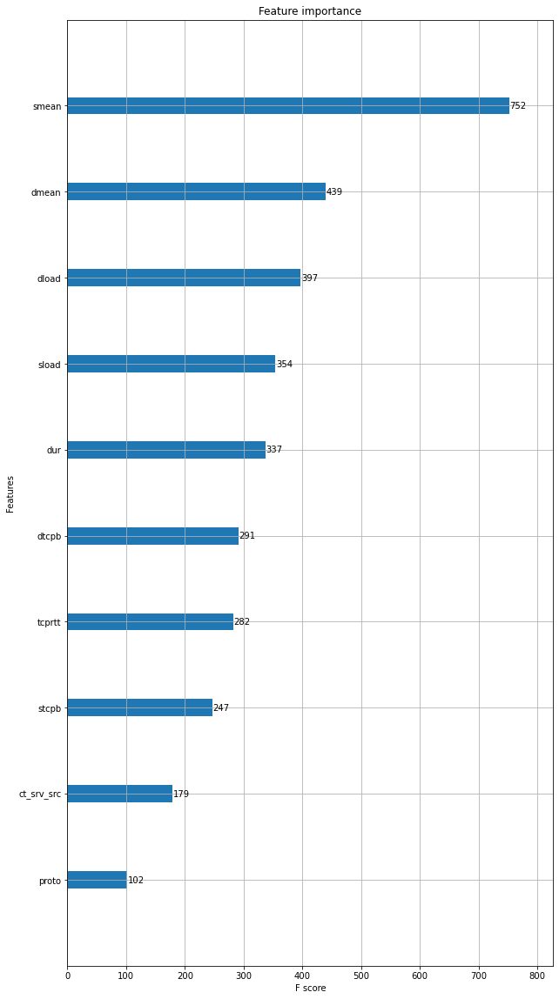

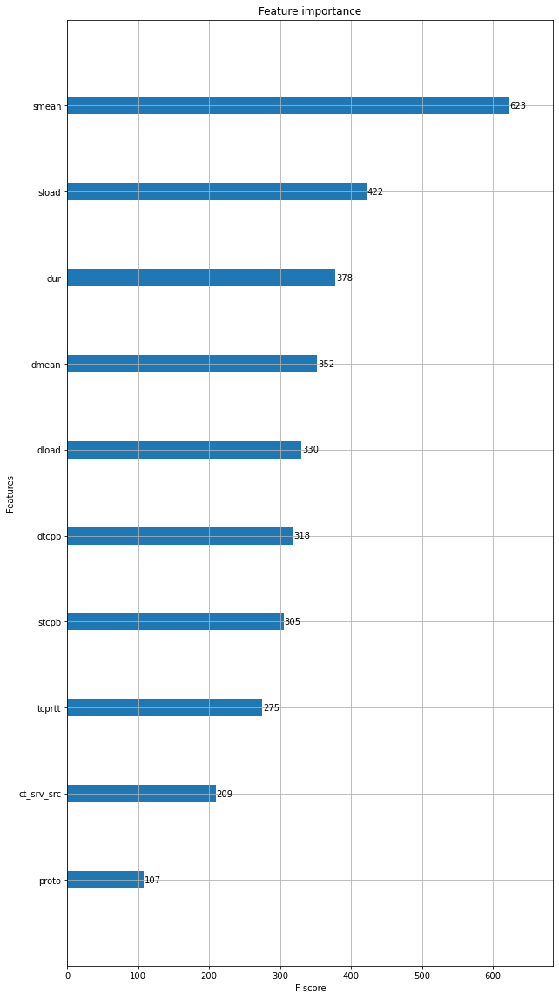

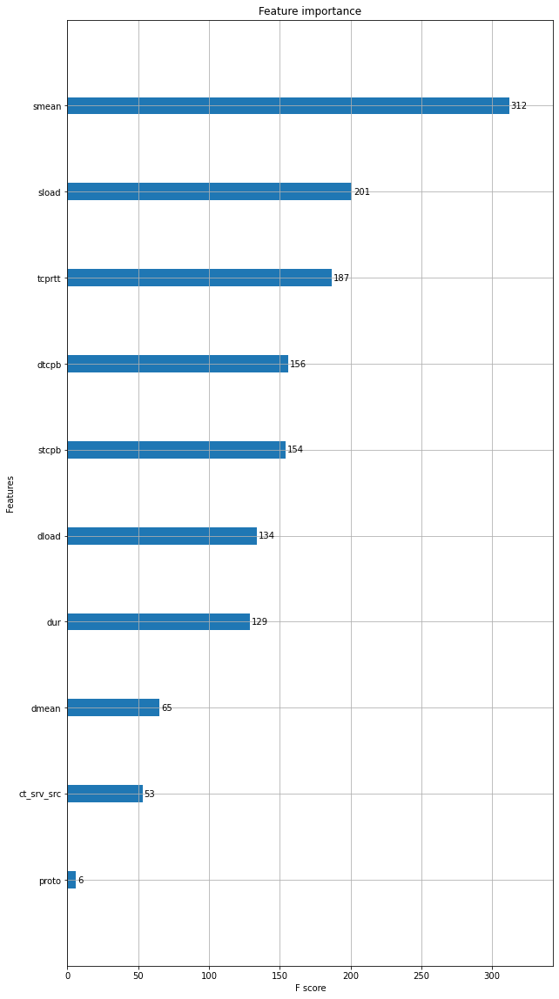

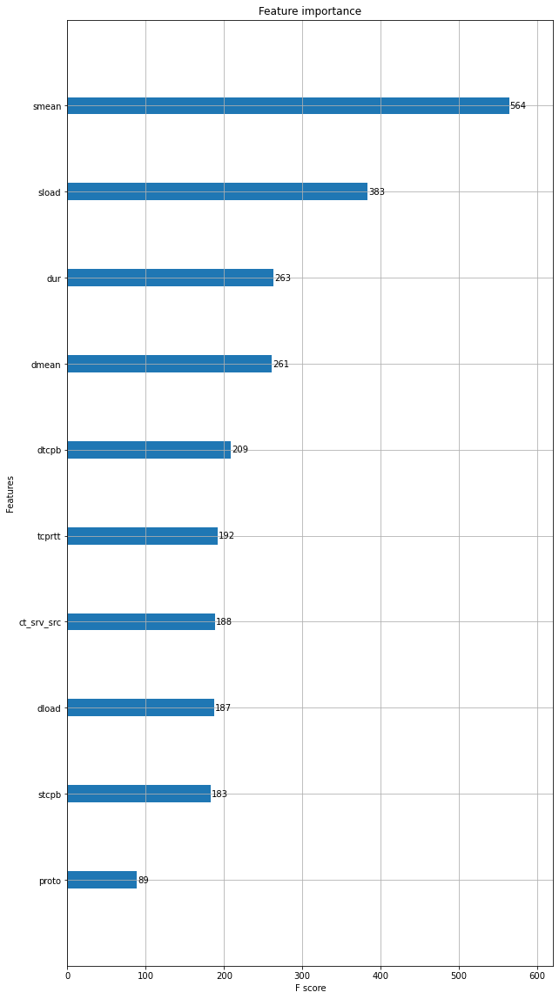

In [49]:
for i in A:
    X_train, X_test, y_train, y_test = train_test_split(X, Y.iloc[:, i],
    test_size=test_size, random_state=seed)
    model = XGBClassifier(nthread = 4 )
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    print(ataque[i])
    print(Y.iloc[:, i].value_counts())
    print('Accuracy',accuracy_score(y_test,predictions))
    fig, ax = plt.subplots(figsize=(10, 20))
    ax.set_title(ataque[i])
    plot_importance(model, max_num_features=15, ax=ax)

In [17]:
X_train, X_test, y_train, y_test = train_test_split(X, Y.dos,
test_size=0.3, random_state=8)
modeldos = XGBClassifier(nthread = 4 )
modeldos.fit(X_train, y_train)
predictions = modeldos.predict(X_test)
pickle.dump(modeldos, open('dosvsataq.sav', 'wb'))
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions)
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Ataque','Dos'],
                      title        = "Matriz de Confusión")
print(precision_score(y_test, predictions))
print(recall_score(y_test,predictions))
print(f1_score(y_test,predictions))

NameError: name 'pickle' is not defined

In [18]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=2)
X_train_res, y_train_res = sm.fit_sample(X, Y.dos)

Accuracy 0.8938316185969772


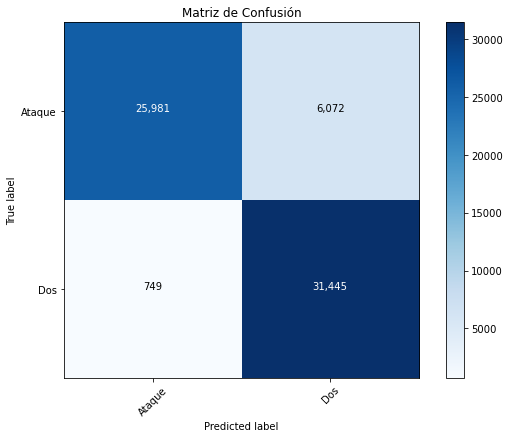

0.8381533704720526
0.9767347953034727
0.9021531752521124


In [19]:
X_train, X_test, y_train, y_test = train_test_split(X_train_res, y_train_res,
test_size=test_size, random_state=seed)
modeldos = XGBClassifier(nthread = 4)
modeldos.fit(X_train, y_train)
predictions = modeldos.predict(X_test)
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions)
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Ataque','Dos'],
                      title        = "Matriz de Confusión")
print(precision_score(y_test, predictions))
print(recall_score(y_test,predictions))
print(f1_score(y_test,predictions))

In [20]:
X_train, X_test, y_train, y_test = train_test_split(X, Y.dos,
test_size=test_size, random_state=seed)

Accuracy 0.840319750438682


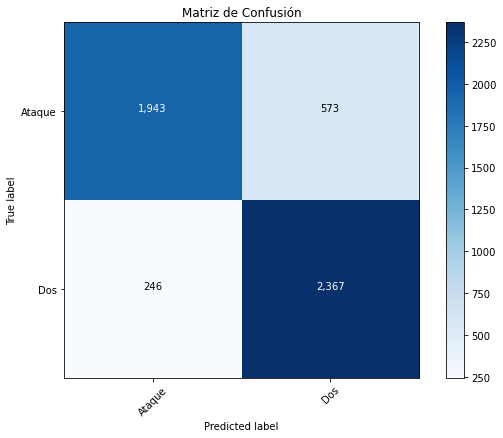

0.8051020408163265
0.9058553386911596
0.8525121555915721


In [21]:
from imblearn.under_sampling import RandomUnderSampler
undersample = RandomUnderSampler(sampling_strategy='majority')
#X_over, y_over = undersample.fit_resample(X, Y.dos)
X_over, y_over = undersample.fit_resample(X_train, y_train)
X_trainUNDER, X_testUNDER, y_trainUNDER, y_testUNDER = train_test_split(X_over, y_over,
test_size=test_size, random_state=seed)
modeldos = XGBClassifier(nthread = 4)
modeldos.fit(X_trainUNDER, y_trainUNDER)
predictionsUNDER = modeldos.predict(X_testUNDER)
print('Accuracy',accuracy_score(y_testUNDER,predictionsUNDER))
cm = confusion_matrix(y_testUNDER,predictionsUNDER)
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Ataque','Dos'],
                      title        = "Matriz de Confusión")
print(precision_score(y_testUNDER, predictionsUNDER))
print(recall_score(y_testUNDER,predictionsUNDER))
print(f1_score(y_testUNDER,predictionsUNDER))

In [ ]:
pickle.dump(modeldos, open('dosvsataq.sav', 'wb'))

Accuracy 0.7809122140602742


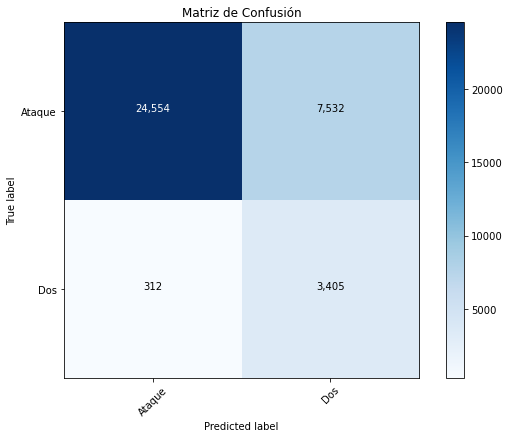

0.31132851787510285
0.9160613397901534
0.4647195305036167


In [22]:
predictions = modeldos.predict(X_test)
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions)
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Ataque','Dos'],
                      title        = "Matriz de Confusión")
print(precision_score(y_test, predictions))
print(recall_score(y_test,predictions))
print(f1_score(y_test,predictions))

In [28]:
# Invoke the TSNE method
tsne = TSNE(n_components=2, verbose=2, perplexity=100, n_iter=2000)
tsne_results_std = tsne.fit_transform(X)

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 119341 samples in 1.431s...
[t-SNE] Computed neighbors for 119341 samples in 15.990s...
[t-SNE] Computed conditional probabilities for sample 1000 / 119341
[t-SNE] Computed conditional probabilities for sample 2000 / 119341
[t-SNE] Computed conditional probabilities for sample 3000 / 119341
[t-SNE] Computed conditional probabilities for sample 4000 / 119341
[t-SNE] Computed conditional probabilities for sample 5000 / 119341
[t-SNE] Computed conditional probabilities for sample 6000 / 119341
[t-SNE] Computed conditional probabilities for sample 7000 / 119341
[t-SNE] Computed conditional probabilities for sample 8000 / 119341
[t-SNE] Computed conditional probabilities for sample 9000 / 119341
[t-SNE] Computed conditional probabilities for sample 10000 / 119341
[t-SNE] Computed conditional probabilities for sample 11000 / 119341
[t-SNE] Computed conditional probabilities for sample 12000 / 119341
[t-SNE] Computed conditional proba

[t-SNE] Computed conditional probabilities in 78.908s
[t-SNE] Iteration 50: error = 109.2429504, gradient norm = 0.0000007 (50 iterations in 54.239s)
[t-SNE] Iteration 100: error = 109.1538925, gradient norm = 0.0008234 (50 iterations in 46.586s)
[t-SNE] Iteration 150: error = 89.2434998, gradient norm = 0.0013553 (50 iterations in 41.926s)
[t-SNE] Iteration 200: error = 78.9228821, gradient norm = 0.0008855 (50 iterations in 44.578s)
[t-SNE] Iteration 250: error = 75.1170044, gradient norm = 0.0006799 (50 iterations in 46.111s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 75.117004
[t-SNE] Iteration 300: error = 3.7387264, gradient norm = 0.0007027 (50 iterations in 42.517s)
[t-SNE] Iteration 350: error = 3.3170850, gradient norm = 0.0005706 (50 iterations in 42.789s)
[t-SNE] Iteration 400: error = 3.0149920, gradient norm = 0.0004604 (50 iterations in 39.379s)
[t-SNE] Iteration 450: error = 2.7527080, gradient norm = 0.0003785 (50 iterations in 38.910s)
[t-SNE]

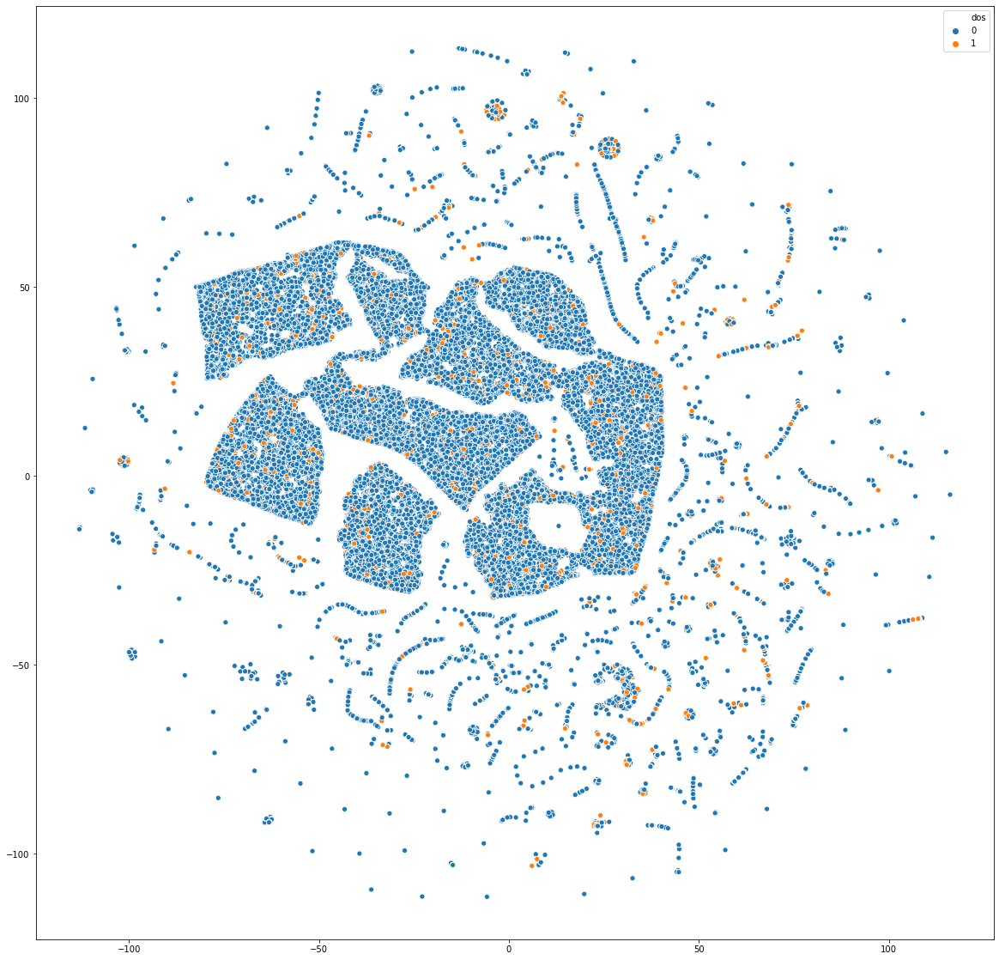

In [30]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results_std[:,0],tsne_results_std[:,1], hue = Y.dos);

In [55]:
# exploits vs todos

Accuracy 0.9126509774623335


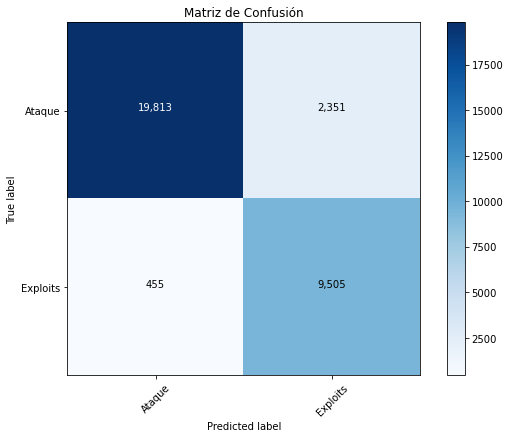

0.8017037786774629
0.9543172690763052
0.8713788045471214


In [23]:
df2 = df2.drop(df2[df2['dos']==1].index)
X = df2.drop(columns=['attack_cat', 'back','analy','fuzz','shell','recon','exploits','dos','worm','generic'])
#X = df2[['smean','sload','dur','dtcpb','stcpb','tcprtt','dmean','ct_srv_src','proto','dload']]
X_train, X_test, y_train, y_test = train_test_split(X, df2.exploits,
test_size=0.3, random_state=8)
modelexploits = XGBClassifier(nthread = 4 )
modelexploits.fit(X_train, y_train)
predictions = modelexploits.predict(X_test)
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions)
plot_confusion_matrix(cm           = cm, 
                      normalize    = False,
                      target_names = ['Ataque','Exploits'],
                      title        = "Matriz de Confusión")
print(precision_score(y_test, predictions))
print(recall_score(y_test,predictions))
print(f1_score(y_test,predictions))

In [31]:
pickle.dump(modelexploits, open('exploitsvsataq.sav', 'wb'))

In [32]:
# Invoke the TSNE method
tsne = TSNE(n_components=2, verbose=2, perplexity=10, n_iter=2000)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 107077 samples in 1.100s...
[t-SNE] Computed neighbors for 107077 samples in 3.057s...
[t-SNE] Computed conditional probabilities for sample 1000 / 107077
[t-SNE] Computed conditional probabilities for sample 2000 / 107077
[t-SNE] Computed conditional probabilities for sample 3000 / 107077
[t-SNE] Computed conditional probabilities for sample 4000 / 107077
[t-SNE] Computed conditional probabilities for sample 5000 / 107077
[t-SNE] Computed conditional probabilities for sample 6000 / 107077
[t-SNE] Computed conditional probabilities for sample 7000 / 107077
[t-SNE] Computed conditional probabilities for sample 8000 / 107077
[t-SNE] Computed conditional probabilities for sample 9000 / 107077
[t-SNE] Computed conditional probabilities for sample 10000 / 107077
[t-SNE] Computed conditional probabilities for sample 11000 / 107077
[t-SNE] Computed conditional probabilities for sample 12000 / 107077
[t-SNE] Computed conditional probabi

KeyboardInterrupt: 

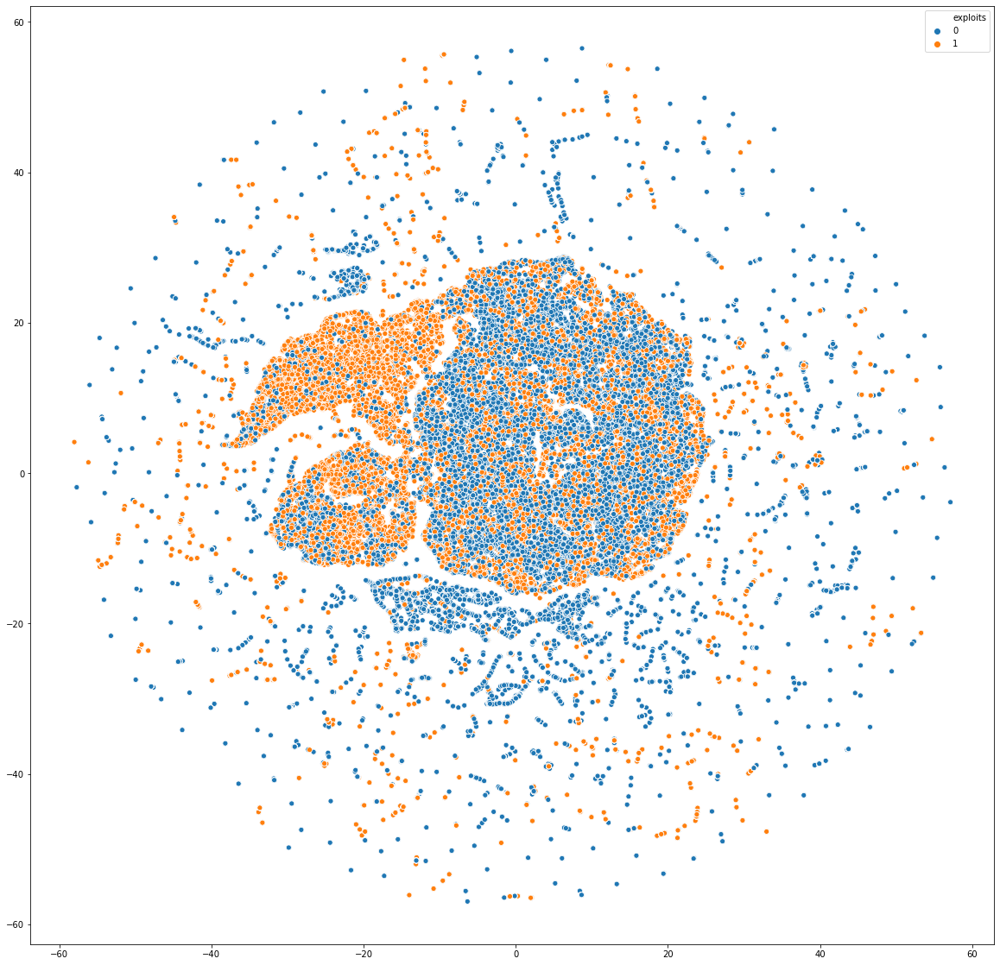

In [59]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results_std[:,0],tsne_results_std[:,1], hue = Y.exploits);

In [60]:
# todos vs todos

In [24]:
df2 = df2.drop(df2[df2['exploits']==1].index)

In [25]:
X = df2.drop(columns=['attack_cat', 'back','analy','fuzz','shell','recon','exploits','dos','worm','generic'])
Y = df2.attack_cat

In [35]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=0.3, random_state=8)
modeltodos = XGBClassifier(nthread = 4 )
modeltodos.fit(X_train, y_train)
predictions = modeltodos.predict(X_test)


In [36]:
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions, labels=np.unique(df2.attack_cat))
print('Precision',precision_score(y_test, predictions, average = None))
print('recall',recall_score(y_test,predictions, average = None))
print('f1 score',f1_score(y_test,predictions, average = None))

Accuracy 0.935085497150095
Precision [0.56857523 0.96591359 0.99765278 0.9086171 ]
recall [0.83235867 0.90527489 0.98763485 0.83466326]
f1 score [0.67563291 0.9346117  0.99261854 0.87007154]


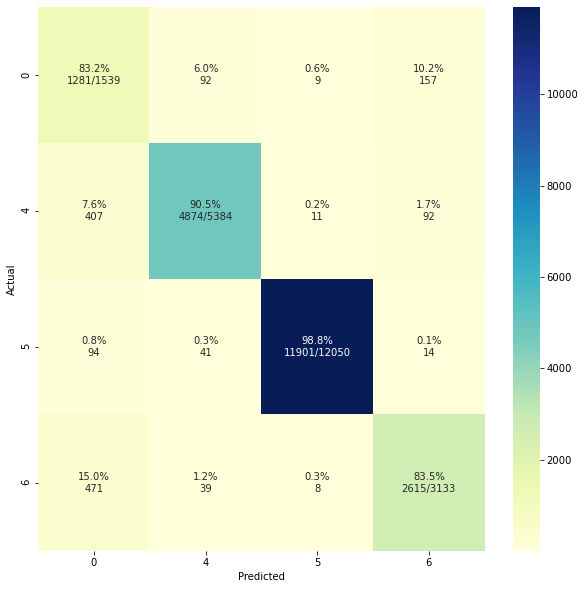

In [37]:
plot_cm(y_test, predictions)

In [37]:
# 4 vs 5 vs 6 vs todos ( 0 1 7 8)

In [38]:
analysis = df2[df2['attack_cat'] == 0]
backdoor = df2[df2['attack_cat'] == 1]
shell = df2[df2['attack_cat'] == 7]
worms = df2[df2['attack_cat'] == 8]

resto = pd.concat([analysis,backdoor,shell,worms])
resto

,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,...,attack_cat,back,analy,fuzz,shell,recon,exploits,dos,worm,generic
47932,0.000009,116,0,2,2,0,200,0,111111.107200,254,...,0,0,1,0,0,0,0,0,0,0
47936,0.000009,116,0,2,2,0,200,0,111111.107200,254,...,0,0,1,0,0,0,0,0,0,0
47938,0.000008,116,0,2,2,0,200,0,125000.000300,254,...,0,0,1,0,0,0,0,0,0,0
47940,0.000008,116,0,2,2,0,200,0,125000.000300,254,...,0,0,1,0,0,0,0,0,0,0
47941,0.000008,116,0,2,2,0,200,0,125000.000300,254,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
158130,1.518915,109,5,1,10,8,1296,354,11.192199,254,...,8,0,0,0,0,0,0,0,1,0
164867,0.694885,109,5,1,10,6,1294,268,21.586305,254,...,8,0,0,0,0,0,0,0,1,0
166196,8.734500,109,5,1,114,686,5154,914758,91.476330,254,...,8,0,0,0,0,0,0,0,1,0
167633,0.605943,109,5,1,10,6,1302,268,24.754803,254,...,8,0,0,0,0,0,0,0,1,0


In [39]:
resto['attack_cat'] = 0

In [40]:
generic = df2[df2['attack_cat'] == 5]
fuzzers = df2[df2['attack_cat'] == 4]
reconn = df2[df2['attack_cat'] == 6]
df4 = pd.concat([generic,fuzzers,reconn,resto])

In [41]:
X = df4.drop(columns=['attack_cat', 'back','analy','fuzz','shell','recon','exploits','dos','worm','generic'])
Y = df4.attack_cat

In [42]:
X_train, X_test, y_train, y_test = train_test_split(X, Y,
test_size=0.3, random_state=8)
model = XGBClassifier(nthread = 4 )
model.fit(X_train, y_train)
predictions = model.predict(X_test)

In [43]:
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions, labels=np.unique(df2.attack_cat))
print('Precision',precision_score(y_test, predictions, average = None))
print('recall',recall_score(y_test,predictions, average = None))
print('f1 score',f1_score(y_test,predictions, average = None))

Accuracy 0.935085497150095
Precision [0.56857523 0.96591359 0.99765278 0.9086171 ]
recall [0.83235867 0.90527489 0.98763485 0.83466326]
f1 score [0.67563291 0.9346117  0.99261854 0.87007154]


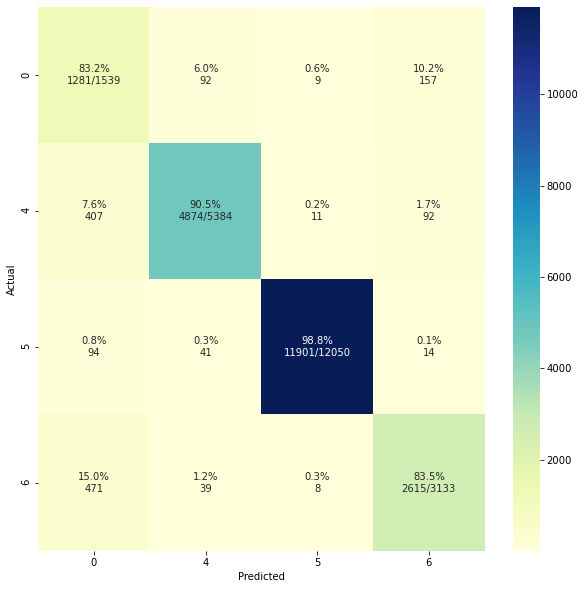

In [44]:
plot_cm(y_test, predictions)

In [47]:
pickle.dump(model, open('genefuzzrecon.sav', 'wb'))

In [38]:
# Invoke the TSNE method
tsne = TSNE(n_components=2, verbose=2, perplexity=40, n_iter=2000)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 73684 samples in 0.829s...
[t-SNE] Computed neighbors for 73684 samples in 4.830s...
[t-SNE] Computed conditional probabilities for sample 1000 / 73684
[t-SNE] Computed conditional probabilities for sample 2000 / 73684
[t-SNE] Computed conditional probabilities for sample 3000 / 73684
[t-SNE] Computed conditional probabilities for sample 4000 / 73684
[t-SNE] Computed conditional probabilities for sample 5000 / 73684
[t-SNE] Computed conditional probabilities for sample 6000 / 73684
[t-SNE] Computed conditional probabilities for sample 7000 / 73684
[t-SNE] Computed conditional probabilities for sample 8000 / 73684
[t-SNE] Computed conditional probabilities for sample 9000 / 73684
[t-SNE] Computed conditional probabilities for sample 10000 / 73684
[t-SNE] Computed conditional probabilities for sample 11000 / 73684
[t-SNE] Computed conditional probabilities for sample 12000 / 73684
[t-SNE] Computed conditional probabilities for sa

[t-SNE] Iteration 1550: error = 0.0845827, gradient norm = 0.0000535 (50 iterations in 14.868s)
[t-SNE] Iteration 1600: error = 0.0491375, gradient norm = 0.0000514 (50 iterations in 14.989s)
[t-SNE] Iteration 1650: error = 0.0173974, gradient norm = 0.0000495 (50 iterations in 16.235s)
[t-SNE] Iteration 1700: error = -0.0154675, gradient norm = 0.0000474 (50 iterations in 15.065s)
[t-SNE] Iteration 1750: error = -0.0466056, gradient norm = 0.0000456 (50 iterations in 15.412s)
[t-SNE] Iteration 1800: error = -0.0721405, gradient norm = 0.0000445 (50 iterations in 15.029s)
[t-SNE] Iteration 1850: error = -0.1054314, gradient norm = 0.0000431 (50 iterations in 15.644s)
[t-SNE] Iteration 1900: error = -0.1293325, gradient norm = 0.0000414 (50 iterations in 15.346s)
[t-SNE] Iteration 1950: error = -0.1524181, gradient norm = 0.0000397 (50 iterations in 14.989s)
[t-SNE] Iteration 2000: error = -0.1783997, gradient norm = 0.0000388 (50 iterations in 15.037s)
[t-SNE] KL divergence after 2000 

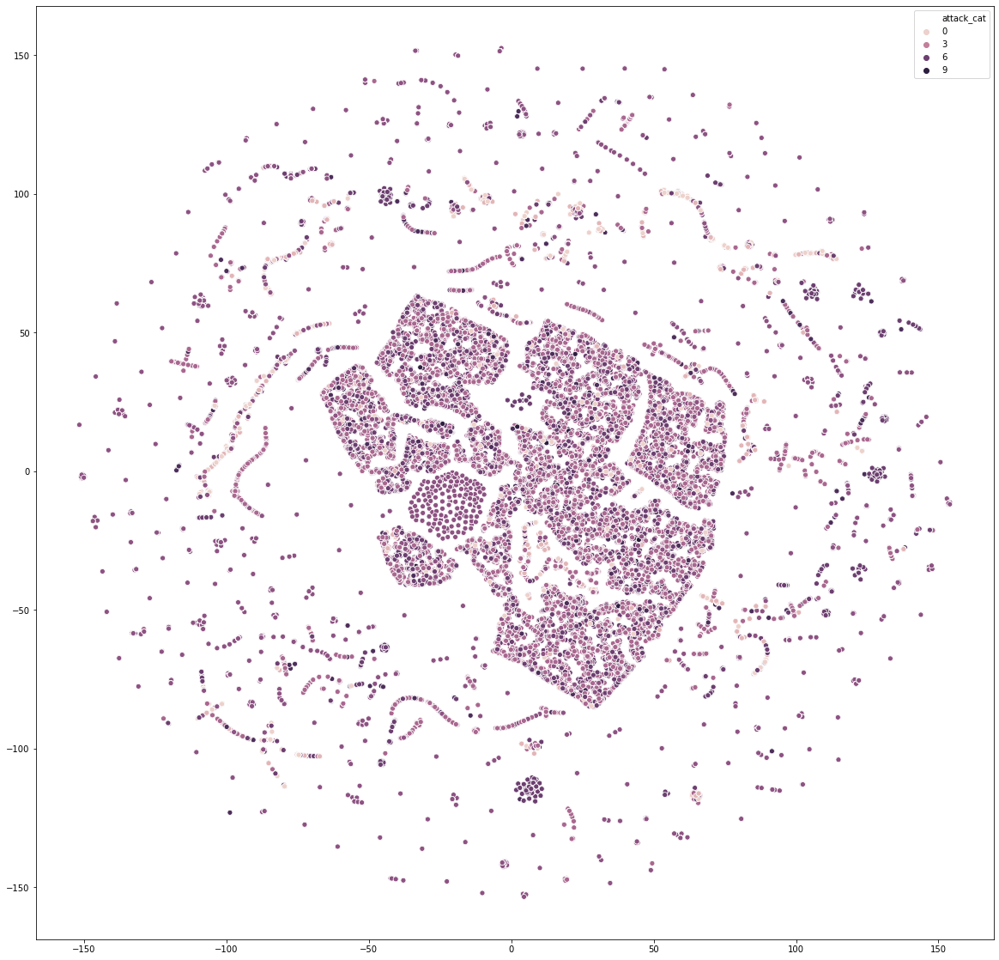

In [41]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = Y);

In [48]:
df3 = df2.drop(df2[df2['fuzz']==1].index)
df3 = df3.drop(df2[df2['generic']==1].index)
df3 = df3.drop(df2[df2['recon']==1].index)

In [49]:
X = df3.drop(columns=['attack_cat', 'back','analy','fuzz','shell','recon','exploits','dos','worm','generic'])
Y = df3.attack_cat

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X,df3.attack_cat,
test_size=0.3, random_state=8)
model = XGBClassifier(nthread = 4 )
model.fit(X_train, y_train)
predictions = model.predict(X_test)


In [53]:
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions, labels=np.unique(df2.attack_cat))
print('Precision',precision_score(y_test, predictions, average = None))
print('recall',recall_score(y_test,predictions, average = None))
print('f1 score',f1_score(y_test,predictions, average = None))

Accuracy 0.6081170991350632
Precision [0.52418097 0.42259414 0.98823529 0.90909091]
recall [0.5553719  0.39223301 0.99115044 0.90909091]
f1 score [0.53932584 0.40684794 0.98969072 0.90909091]


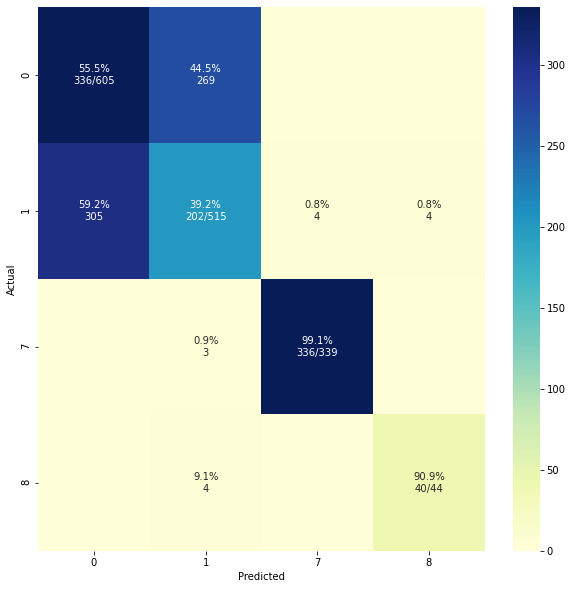

In [54]:
plot_cm(y_test, predictions)

In [47]:
tsne = TSNE(n_components=2, verbose=2, perplexity=40, n_iter=2000)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 5009 samples in 0.022s...
[t-SNE] Computed neighbors for 5009 samples in 0.200s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5009
[t-SNE] Computed conditional probabilities for sample 2000 / 5009
[t-SNE] Computed conditional probabilities for sample 3000 / 5009
[t-SNE] Computed conditional probabilities for sample 4000 / 5009
[t-SNE] Computed conditional probabilities for sample 5000 / 5009
[t-SNE] Computed conditional probabilities for sample 5009 / 5009
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 1.274s
[t-SNE] Iteration 50: error = 74.2079620, gradient norm = 0.0266490 (50 iterations in 1.204s)
[t-SNE] Iteration 100: error = 61.5940018, gradient norm = 0.0130732 (50 iterations in 0.957s)
[t-SNE] Iteration 150: error = 58.0001106, gradient norm = 0.0075978 (50 iterations in 0.910s)
[t-SNE] Iteration 200: error = 56.1979332, gradient norm = 0.0058303 (50 iterations in 0.869s)
[

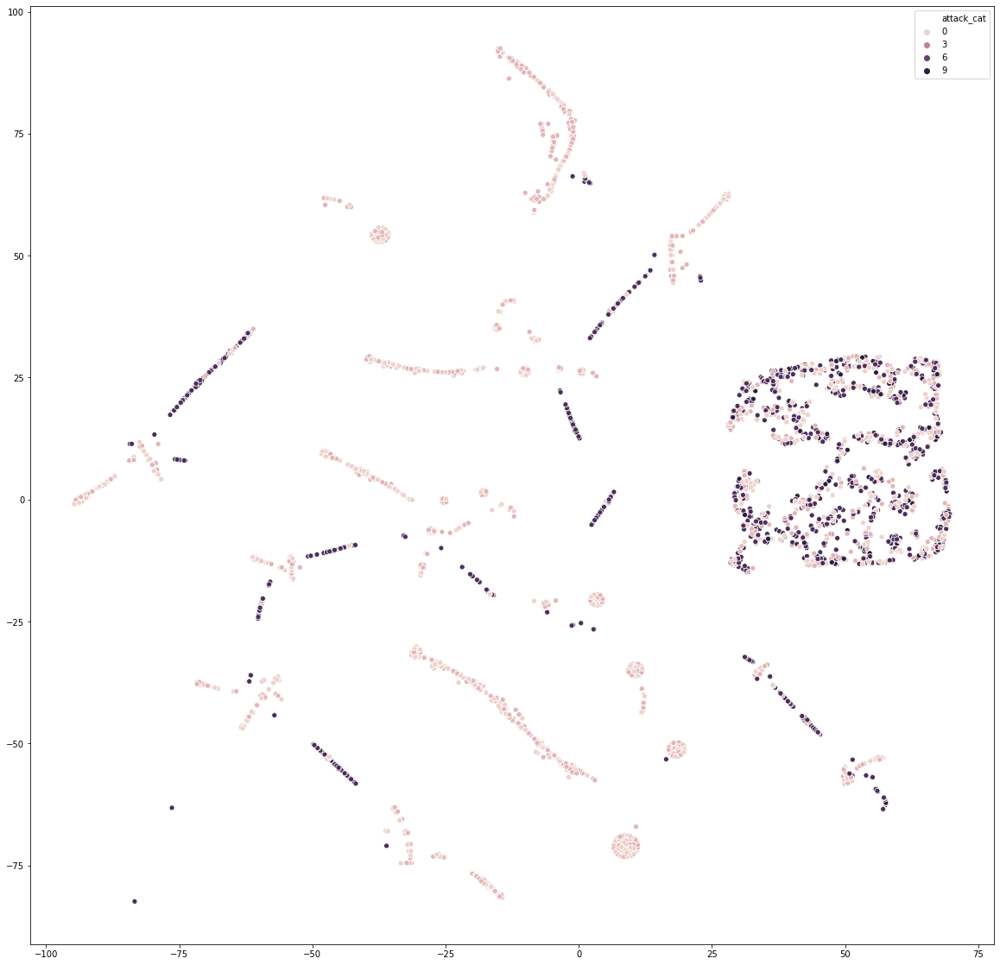

In [52]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = df3.attack_cat);

In [ ]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results_std[:,0],tsne_results_std[:,1], hue = Y);

In [ ]:
# 7 vs 8 vs resto

In [48]:
analysis = df2[df2['attack_cat'] == 0]
backdoor = df2[df2['attack_cat'] == 1]
resto = pd.concat([analysis,backdoor])
resto['attack_cat'] = 0

In [49]:
shell = df2[df2['attack_cat'] == 7]
worms = df2[df2['attack_cat'] == 8]
df4 = pd.concat([shell,worms,resto])

In [50]:
X = df4.drop(columns=['attack_cat', 'back','analy','fuzz','shell','recon','exploits','dos','worm','generic'])
Y = df4.attack_cat

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X,Y,
test_size=0.3, random_state=8)
model = XGBClassifier(nthread = 4 )
model.fit(X_train, y_train)
predictions = model.predict(X_test)


In [52]:
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions, labels=np.unique(df2.attack_cat))
print('Precision',precision_score(y_test, predictions, average = None))
print('recall',recall_score(y_test,predictions, average = None))
print('f1 score',f1_score(y_test,predictions, average = None))

Accuracy 0.9906852960745176
Precision [0.99908925 0.9703504  0.94117647]
recall [0.98828829 1.         0.96969697]
f1 score [0.99365942 0.98495212 0.95522388]


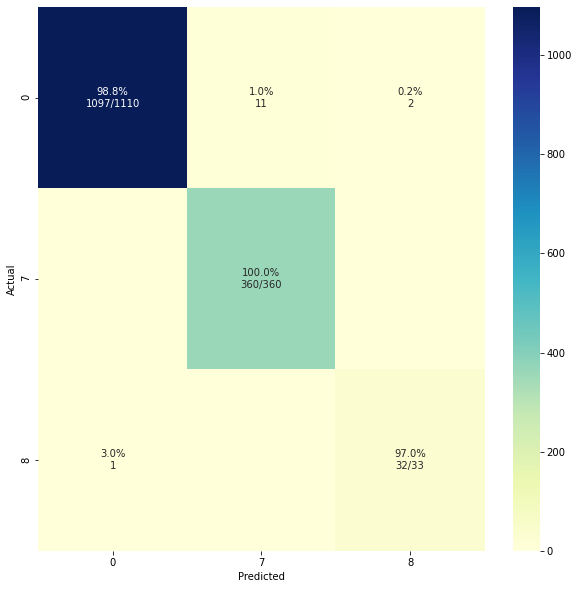

In [53]:
plot_cm(y_test, predictions)

In [54]:
pickle.dump(model, open('shellvworm.sav', 'wb'))

In [66]:
# 0 vs 1

In [65]:
df2.attack_cat.value_counts()

5    40000
4    18184
6    10491
0     2000
1     1746
7     1133
8      130
Name: attack_cat, dtype: int64

In [60]:
df5 = df2.drop(df2[df2['shell']==1].index)
df4 = df4.drop(df2[df2['worm']==1].index)

In [76]:
analysis = df2[df2['attack_cat'] == 0]
backdoor = df2[df2['attack_cat'] == 1]

In [78]:
anba = pd.concat([analysis,backdoor])

In [81]:
X = anba.drop(columns=['attack_cat'])
Y = anba.attack_cat

In [82]:
Y.value_counts()

0    2000
1    1746
Name: attack_cat, dtype: int64

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X,Y,
test_size=0.3, random_state=8)
modeldos = XGBClassifier(nthread = 4 )
modeldos.fit(X_train, y_train)
predictions = modeldos.predict(X_test)

In [84]:
print('Accuracy',accuracy_score(y_test,predictions))
cm = confusion_matrix(y_test,predictions, labels=np.unique(df2.attack_cat))
print('Precision',precision_score(y_test, predictions, average = None))
print('recall',recall_score(y_test,predictions, average = None))
print('f1 score',f1_score(y_test,predictions, average = None))

Accuracy 0.49466192170818507
Precision [0.52380952 0.45748988]
recall [0.55183946 0.42965779]
f1 score [0.53745928 0.44313725]


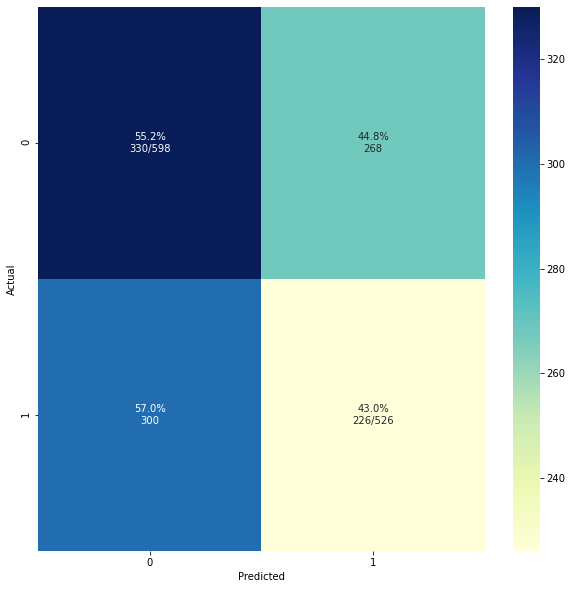

In [85]:
plot_cm(y_test, predictions)

In [86]:
pickle.dump(modeldos, open('0v1.sav', 'wb'))

In [73]:
# Invoke the TSNE method
tsne = TSNE(n_components=2, verbose=2, perplexity=30, n_iter=2000)
tsne_results = tsne.fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3746 samples in 0.016s...
[t-SNE] Computed neighbors for 3746 samples in 0.117s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3746
[t-SNE] Computed conditional probabilities for sample 2000 / 3746
[t-SNE] Computed conditional probabilities for sample 3000 / 3746
[t-SNE] Computed conditional probabilities for sample 3746 / 3746
[t-SNE] Mean sigma: 0.000000
[t-SNE] Computed conditional probabilities in 0.545s
[t-SNE] Iteration 50: error = 71.5661469, gradient norm = 0.0371179 (50 iterations in 0.767s)
[t-SNE] Iteration 100: error = 59.6364822, gradient norm = 0.0191960 (50 iterations in 0.656s)
[t-SNE] Iteration 150: error = 56.0322456, gradient norm = 0.0120073 (50 iterations in 0.619s)
[t-SNE] Iteration 200: error = 54.1838455, gradient norm = 0.0099628 (50 iterations in 0.548s)
[t-SNE] Iteration 250: error = 53.0153122, gradient norm = 0.0073533 (50 iterations in 0.577s)
[t-SNE] KL divergence after 250 iterati

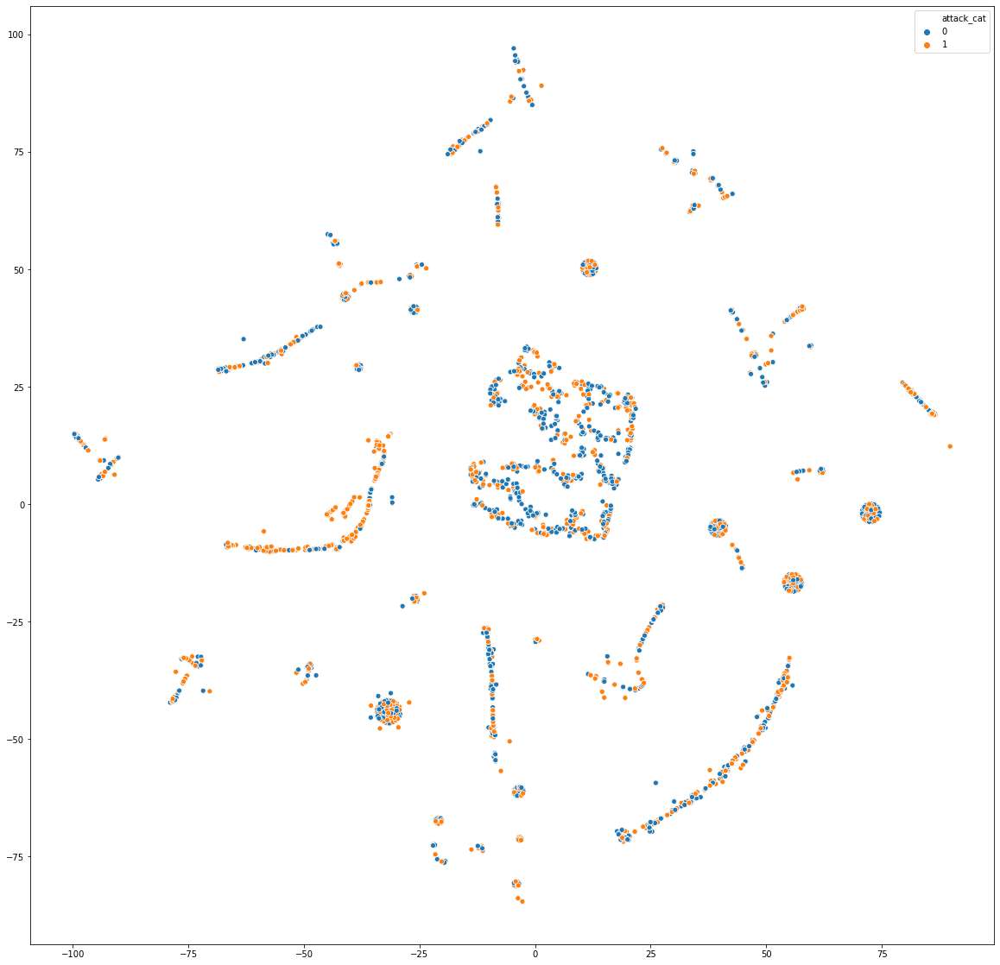

In [74]:
plt.figure(figsize=(20,20))
sns.scatterplot(tsne_results[:,0],tsne_results[:,1], hue = df3.attack_cat);